In [1]:
import SciServer.CasJobs as CasJobs # query with CasJobs
import SciServer.SciDrive           # read/write to/from SciDrive

In [2]:
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import astropy.io.fits as astrofits
from astropy.table import Table
import scipy
from scipy import interpolate
import skimage.io 
import urllib3
import io
import copy
import gc # needed because the pandas plotting routines open too many files and cause crashes (maybe also mongo)
%matplotlib inline

In [3]:
import sys
import importlib
customClassesPath='/Users/hughdickinson/Documents/Development/Sloan-Illustris-Comparison/python_classes'
if customClassesPath not in sys.path :
    sys.path.append(customClassesPath)
#import PandasResampling 
#importlib.reload(PandasResampling)
from PandasResampling import SimpleAcceptReject
import MongoDataLoader 
importlib.reload(MongoDataLoader)
from MongoDataLoader import MongoDataHandler

In [88]:
verbose = False
sanityChecks = False
import pprint
from IPython.core.display import display
prettyPrinter = pprint.PrettyPrinter(indent=4)

histPlotPars = {'histtype' : 'step', 'fill' : True, 'alpha': 0.2}
unifiedColourMap = matplotlib.cm.get_cmap('spectral')
unifiedTriColourMap = ['r', 'g', 'b']

In [5]:
# Switch and path to enable serialization of Illustris Halo data for GZ subjects that are retrieved from the Illustris 
# web service
#saveIllustrisHaloData = False
#pickleDataPath = '/Users/hughdickinson/Documents/Development/Sloan-Illustris-Comparison/data/IllustrisHaloData.pkl'
#pickleMetaDataPath = '/Users/hughdickinson/Documents/Development/Sloan-Illustris-Comparison/data/IllustrisHaloMetaData.pkl'
#saveSDSSData = False
#pickleSDSSDataPath = '/Users/hughdickinson/Documents/Development/Sloan-Illustris-Comparison/data/SDSSZooniverseData.pkl'
#saveIllustrisZooData = False
#pickleIllustrisDataPath = '/Users/hughdickinson/Documents/Development/Sloan-Illustris-Comparison/data/IllustrisZooniverseData.pkl'

# Data on Galaxy Zoo Volunteer base
saveGZUserData = False

# Data pertaining to Galaxy Zoo classification statistics
saveIllustrisClassificationData = False

# Data pertaining to the physical and book-keeping properties of galaxies in the Illustris dataset
saveIllustrisMetaData = False

# A synthetic table formed by joining the galaxy metadata and classification statistics
saveIllustrisCombinedData = False

saveIllustrisHaloMetaData = False

saveIllustrisHaloData = False

saveCasJobsSdssData = False
#pickleGZUserDataPath = '/Users/hughdickinson/Documents/Development/Sloan-Illustris-Comparison/data/GZUserData.pkl'

## Load data from Galaxy Zoo `mongodb` database
Uses custom `MongoDataHandler` class.

In [6]:
mdh = MongoDataHandler()

### Retrieve the names of the different surveys that have been classified in Galaxy Zoo

In [7]:
# This query is so fast that saving/loading is not supported
mdhSurveyNames = mdh.getSurveyNames()
display(mdhSurveyNames)

,name
0,candels
1,sloan
2,candels_2epoch
3,ferengi
4,goods_full
5,illustris
6,sloan_singleband
7,decals
8,ukidss
9,sdss_lost_set


### Retrieve data pertaining to Galaxy Zoo volunteers

In [8]:
if not saveGZUserData :
    mdh.loadUserData()
mdhUserData = mdh.getUserData()
if saveGZUserData :
    mdh.saveUserData()
if verbose :
    display(mdhUserData)

### Retrieve data for GalaxyZoo subjects in the `Illustris` subject group

#### Aside: The GalaxyZoo Illustris dataset
The **initial** set of illustris images that **have been** classified by GalaxyZoo volunteers is described [here](https://github.com/willettk/illustris/blob/master/analysis/illustris_gz_analysis.pdf).

There are two distict datasets that can be distinguished by the `metadata.priority` field for all images in the Illustris dataset listed in the `galaxy_zoo_subjects` collection of the mongo database.

The values for the `metadata.priority` field and their interpretation are:

 - `fixed_mass`: (10,832 galaxies) - This subset includes images for all camera angles and backgrounds within two narrow mass ranges (low and high). This is for analyzing the effect of viewing angle and background on morphological accuracy.
 - `fixed_view`: (6,214 galaxies) - This subset spans the full mass range of the sample, but with only 1 camera angle and background per galaxy. This is for doing an initial survey of the morphological distributions.

In [9]:
if not saveIllustrisClassificationData :
    mdh.loadIllustrisClassificationData()
mdhIllustrisClassificationData = mdh.getIllustrisClassificationData()
if saveIllustrisClassificationData :
    mdh.saveIllustrisClassificationData()
if verbose :
    display(mdhIllustrisClassificationData)

if not saveIllustrisMetaData :
    mdh.loadIllustrisMetaData()
mdhMetaData = mdh.getIllustrisMetaData()
if saveIllustrisMetaData :
    mdh.saveIllustrisMetaData()
if verbose :
    display(mdhMetaData)

if not saveIllustrisCombinedData :
    mdh.loadIllustrisCombinedData()
mdhCombinedData = mdh.getIllustrisCombinedData()
if saveIllustrisCombinedData :
    mdh.saveIllustrisCombinedData()
if verbose :
    display(mdhCombinedData)

### Define a filter function that will enable rejection of anonymous users or those with fewer than 50 classifications

In [10]:
def userFilter(userName, userNamesFrame) :
    return any((userNamesFrame.index == userName) & (userNamesFrame.classification_count > 50))

### Count the number of galaxies in the `fixed_mass`, `fixed_view` and `first_fixed_mass` subsets

Recall the expected values are:
 - `fixed_mass`: 10,832 galaxies
 - `fixed_view`: 6,214 galaxies

In [11]:
galaxyPropertiesAndVotesIllustrisFrame = mdhCombinedData
numFixedMass = len(mdhCombinedData[mdhCombinedData['priority']=='fixed_mass'].index)
numFixedView = len(mdhCombinedData[mdhCombinedData['priority']=='fixed_view'].index)
numFirstFixedMass = len(mdhCombinedData[mdhCombinedData['priority']=='first_fixed_mass'].index)


print('Number in "fixed_mass" subset => ', numFixedMass)
print('Number in "fixed_view" subset => ', numFixedView)
print('Number in "first_fixed_mass" subset => {}, (x16 => {})'.format(numFirstFixedMass, 16*numFirstFixedMass))

Number in "fixed_mass" subset =>  10832
Number in "fixed_view" subset =>  6214
Number in "first_fixed_mass" subset => 677, (x16 => 10832)


### Plot distributions of summary quantities extracted from the GalaxyZoo database for different `priority` subsets
As an illustration and sanity check on the data extracted froom the Galaxy Zoo database. Generate distributions of:
* Absolute r-band magnitude (`absmag_r`)
* Logarithm of the half-mass radius (`log_radius_half`)
* Logarithm of the star formation rate (`log_sfr`)
* Logarithm of **total** mass in units of $M_{\odot}$ (`mass_log_msun`)
* The fraction of classifiers that categorized a galaxy as **features** (`p_features`)
* The fraction of classifiers that categorized a galaxy as **smooth** (`p_smooth`)

Also add columns for de-logged values the half-mass radius (`radius_half`), halo mass (`mass_msun`), and star formation rate (`sfr`).

In [12]:
mdhCombinedData['radius_half'] = 10**mdhCombinedData['log_radius_half']
mdhCombinedData['mass_msun'] = 10**mdhCombinedData['mass_log_msun']
mdhCombinedData['sfr'] = 10**mdhCombinedData['log_sfr']

#### Plot distributions for the `fixed_view` subset

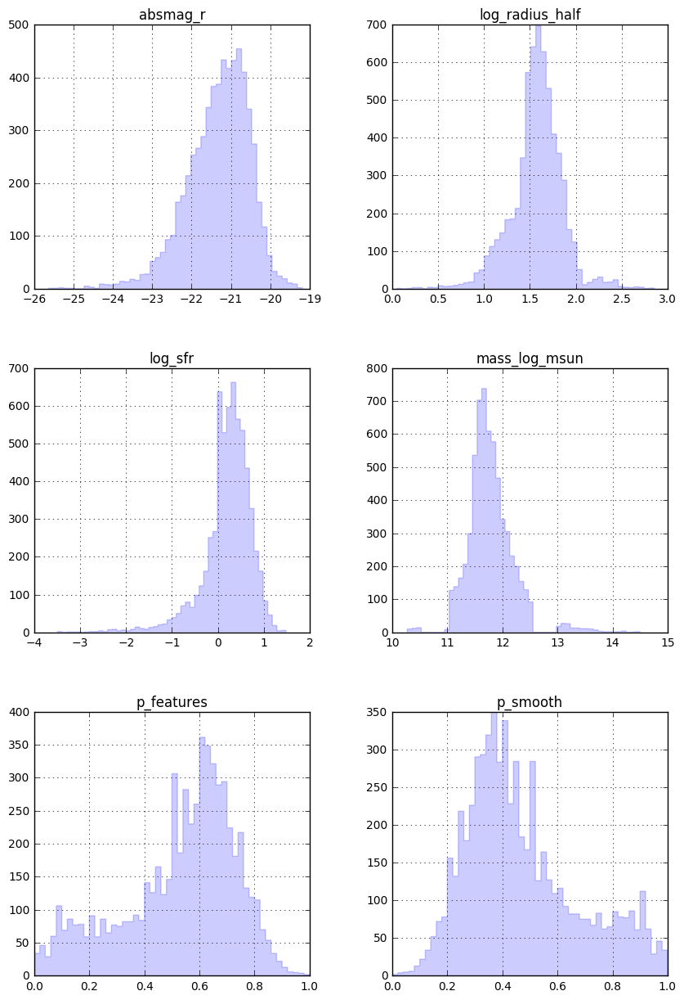

In [13]:
fixedViewSummaryDistributions = mdhCombinedData[mdhCombinedData['priority'] == "fixed_view"].hist(bins=50, figsize=(10, 15), column=["mass_log_msun", "log_radius_half", "log_sfr", "absmag_r", 'p_smooth', 'p_features'], histtype='step', fill=True, alpha=0.2)

#### Plot distributions for the `fixed_mass` subset

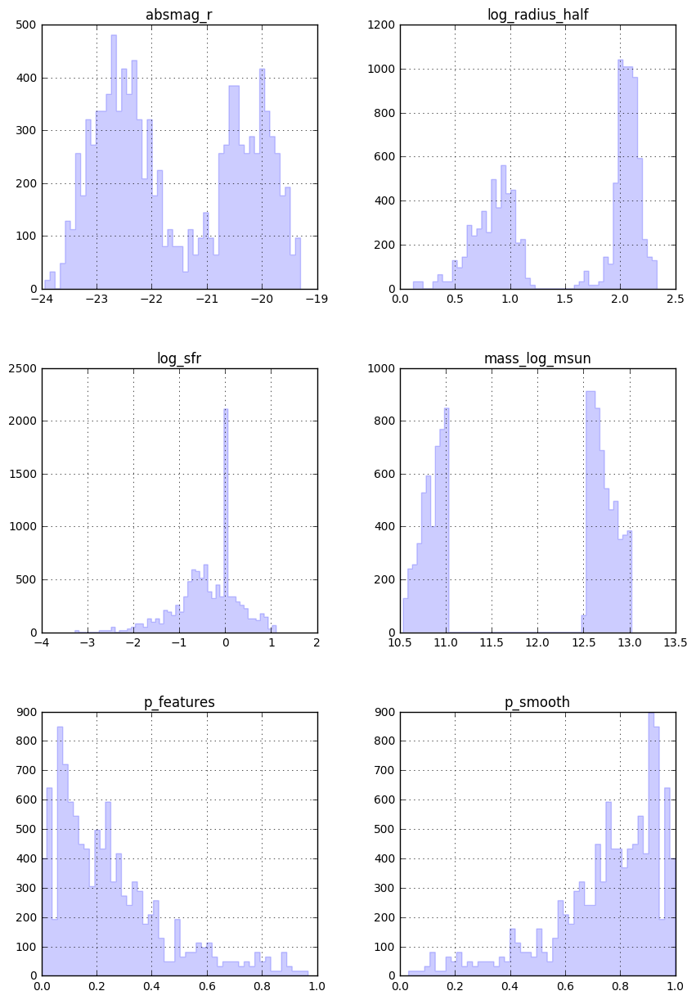

In [14]:
fixedMassSummaryDistributions = mdhCombinedData[mdhCombinedData['priority'] == "fixed_mass"].hist(bins=50, figsize=(10, 15), column=["mass_log_msun", "log_radius_half", "log_sfr", "absmag_r", 'p_smooth', 'p_features'], histtype='step', fill=True, alpha=0.2)

#### Plot distributions for the `first_fixed_mass` subset

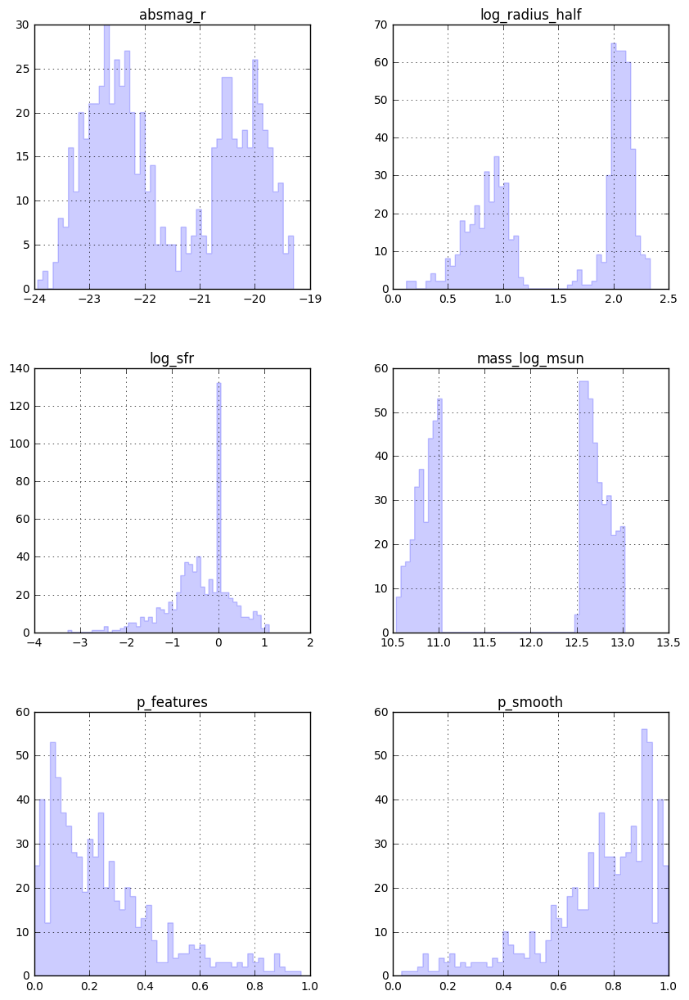

In [15]:
firstFixedMassSummaryDistributions = mdhCombinedData[mdhCombinedData['priority'] == "first_fixed_mass"].hist(bins=50, figsize=(10, 15), column=["mass_log_msun", "log_radius_half", "log_sfr", "absmag_r", 'p_smooth', 'p_features'], histtype='step', fill=True, alpha=0.2)

#### Plot distributions for the union of the `fixed_view` and `first_fixed_mass` subsets

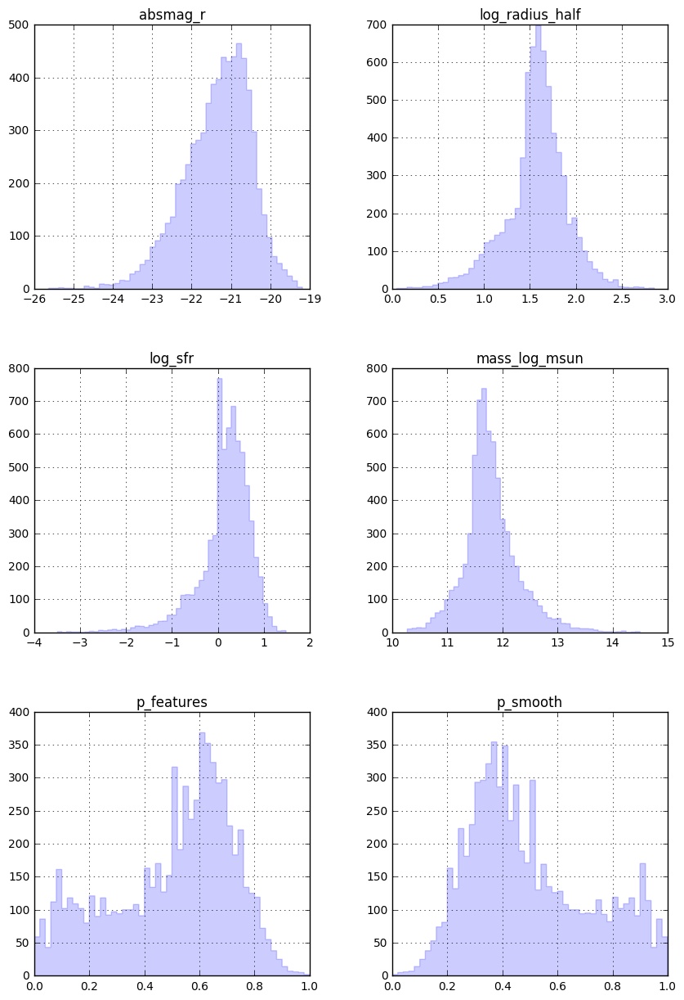

In [16]:
fixedViewAndFirstFixedMassSummaryDistributions = mdhCombinedData[(mdhCombinedData['priority'] == "first_fixed_mass") | (mdhCombinedData['priority'] == "fixed_view")].hist(bins=50, figsize=(10, 15), column=["mass_log_msun", "log_radius_half", "log_sfr", "absmag_r", 'p_smooth', 'p_features'], histtype='step', fill=True, alpha=0.2)

### Plots to illustrate the **total** mass distributions of the various `priority` subsets
The **total** mass includes the mass of dark matter, stars, gas and halos.

In [17]:
if sanityChecks :
    gc.collect()
    colorConv = matplotlib.colors.ColorConverter()
    massSelectionFigure = plt.figure(figsize=(5, 5))
    axes = galaxyPropertiesAndVotesIllustrisFrame[galaxyPropertiesAndVotesIllustrisFrame['priority'] == "fixed_mass"]["mass_log_msun"].plot.hist(ax = massSelectionFigure.gca(), ec='k', fc=colorConv.to_rgba(arg='r', alpha=0.4),histtype='step', fill=True, label='Fixed Mass', bins=100, range=(10, 15))
    axes = galaxyPropertiesAndVotesIllustrisFrame[galaxyPropertiesAndVotesIllustrisFrame['priority'] == "fixed_view"]["mass_log_msun"].plot.hist(ax = axes, ec='k', fc=colorConv.to_rgba(arg='b', alpha=0.4),histtype='step', fill=True, label='Fixed View', bins=100, range=(10, 15))
    axes = galaxyPropertiesAndVotesIllustrisFrame[galaxyPropertiesAndVotesIllustrisFrame['priority'] == "first_fixed_mass"]["mass_log_msun"].plot.hist(ax = axes, ec='k', fc=colorConv.to_rgba(arg='g', alpha=0.4),histtype='step', fill=True, label='First Fixed View', bins=100, range=(10, 15))
    lines, labels = massSelectionFigure.gca().get_legend_handles_labels()
    labels = ['Illustris Fixed Mass', 'Illustris Fixed View', 'Illustris First Fixed Mass']
    massSelectionFigure.gca().legend(lines[:3], labels[:3], loc='best', fontsize='medium')
    massSelectionFigure.gca().tick_params(labelsize=12)
    plt.suptitle('Total Mass Distributions for Galaxy Zoo Illustris Data Subsets', fontsize=10)
    plt.xlabel(r'$\log_{10}(M_{\rm subhalo}^{\rm total})\;[(10\cdot{\rm M_{\odot}}/h]$', fontsize=12)
    plt.ylabel('Frequency', fontsize=10)    

### Use the Illustris web service to obtain detailed information for the subset of galaxies used in GalaxyZoo.
The GalaxyZoo mongo database entry for each subject includes a `metadata` field, which includes a subset of salient information about provided by the Illustris team for each subhalo in the GalaxyZoo database.

Far more detailed information can be retrieved for each subhalo using the **Illustris web service**.

The API key must be renewed by logging into the [*Illustris* public data access site](http://www.illustris-project.org/data/) and will remain current until you explicity log out. Update the subsequent cell with your personal API access key.

In [18]:
illustrisAPIKey="44ddc0a0574472a27514600007f1a6a1"

Functionality for retrieving, manipulating, saving and loading of data provided the Illustris web service is provided by the custom-developed `IllustrisWebDataLoader` class.

In [19]:
from IllustrisWebDataLoader import IllustrisWebDataLoader

In [20]:
iwda = IllustrisWebDataLoader(illustrisAPIKey)

if verbose :
    iwda.printWebServiceSchema()
    iwda.printAvailableSimulationData()
    iwda.printSimulationMetaData()
    iwda.printSimulationSnapshotMetaData()

### Retrieve metadata for all subhalos with IDs below the maximum subhalo ID in the Galaxy Zoo dataset
This may retrieve superflous data if the Galaxy Zoo dataset is a sparse sampling of the full Illustris, but guarantees that metadata will be retrieved for **all** galaxies in the Galaxy Zoo dataset.

In [21]:
if saveIllustrisHaloMetaData :
    iwdaHaloMetaDataFrame = iwda.getSimulationHaloMetaData(limit = mdhCombinedData.index.max())
    iwda.saveHaloMetaData()
else :
    iwdaHaloMetaDataFrame = iwda.loadHaloMetaData()

In [22]:
if verbose :
    display(iwdaHaloMetaDataFrame)

### Optional Sanity Checks

As a consistency check, compare the masses of the subhalos retrieved from the GalaxyZoo database with those retrieved directly from the *Illustris* web service. They should be very close if the data correspond to the same subhalos. 

**NOTE:** Numerical accuracy may prevent exact matches between the two data sources.

Perform a merge which uses the subhalo ID to pair metadata from the (web-service-provided) Illustris zero-redshift subhalo sample with corresponding values that were retrieved the GalaxyZoo mongo database.

In [23]:
mdhAndIwdaCombinedData = mdhCombinedData.merge(iwdaHaloMetaDataFrame,
                                               how='left', 
                                               left_index=True, 
                                               right_index=True,
                                               suffixes=("_gz2_mongodb", "_illustris_webservice"))
if verbose :
    display(mdhAndIwdaCombinedData)
    display(mdhAndIwdaCombinedData.columns.values)

Add a column listing (`mass_log_msun_delta`) the computed difference between the mass values provided from the Illustris web service and those stored in the GalaxyZoo mongo database.

In [24]:
mdhAndIwdaCombinedData["mass_log_msun_delta"] = mdhAndIwdaCombinedData["mass_log_msun_gz2_mongodb"] - mdhAndIwdaCombinedData["mass_log_msun_illustris_webservice"] 
if verbose :
    display(mdhAndIwdaCombinedData)
    display(mdhAndIwdaCombinedData.columns.values)

Generate plots comparing the mass estimates stored in the metadata for each subject in the the GalaxyZoo mongo database with those retrieved directly from the Illustris web service for the same `subhalo_id`s.

First make the plot for **all** `subhalo_id` values.

In [25]:
if sanityChecks :
    massCompPlots = plt.figure(figsize=(10, 4))
    massCompScatterAxes = massCompPlots.add_subplot(1,2,1)
    massCompHistAxes = massCompPlots.add_subplot(1,2,2)
    massCompScatterAxes = mdhAndIwdaCombinedData.plot(y="mass_log_msun_delta", ax=massCompScatterAxes)
    massCompScatterAxes.set_ylim(2.45e-3, 2.5e-3)
    massCompHistAxes = mdhAndIwdaCombinedData[["mass_log_msun_gz2_mongodb", "mass_log_msun_illustris_webservice"]].plot.hist(bins=100, ax=massCompHistAxes,histtype='step', fill=True, alpha=0.2, range=(10, 15))

Now isolate the `fixed_mass` sample.

In [26]:
if sanityChecks :
    fixedMassMassCompPlots = plt.figure(figsize=(10, 4))
    fixedMassMassCompScatterAxes = fixedMassMassCompPlots.add_subplot(1,2,1)
    fixedMassMassCompHistAxes = fixedMassMassCompPlots.add_subplot(1,2,2)
    fixedMassMassCompScatterAxes = mdhAndIwdaCombinedData[mdhAndIwdaCombinedData['priority'] == 'fixed_mass'].plot(y="mass_log_msun_delta", ax=fixedMassMassCompScatterAxes)
    fixedMassMassCompScatterAxes.set_ylim(2.45e-3, 2.5e-3)
    fixedMassMassCompHistAxes = mdhAndIwdaCombinedData[mdhAndIwdaCombinedData['priority'] == 'fixed_mass'][["mass_log_msun_gz2_mongodb", "mass_log_msun_illustris_webservice"]].plot.hist(bins=100, ax=fixedMassMassCompHistAxes, histtype='step', fill=True, alpha=0.2)

Now isolate the `fixed_view` sample.

In [27]:
if sanityChecks :
    fixedViewMassCompPlots = plt.figure(figsize=(10, 4))
    fixedViewMassCompScatterAxes = fixedViewMassCompPlots.add_subplot(1,2,1)
    fixedViewMassCompHistAxes = fixedViewMassCompPlots.add_subplot(1,2,2)
    fixedViewMassCompScatterAxes = mdhAndIwdaCombinedData[mdhAndIwdaCombinedData['priority'] == 'fixed_view'].plot(y="mass_log_msun_delta", ax=fixedViewMassCompScatterAxes)
    fixedViewMassCompScatterAxes.set_ylim(2.45e-3, 2.5e-3)
    fixedViewMassCompHistAxes = mdhAndIwdaCombinedData[mdhAndIwdaCombinedData['priority'] == 'fixed_view'][["mass_log_msun_gz2_mongodb", "mass_log_msun_illustris_webservice"]].plot.hist(bins=100, ax=fixedViewMassCompHistAxes, histtype='step', fill=True, alpha=0.2)

**NOTE**: The `fixed_mass` and `fixed_view` subsets are **disjoint**.

### Retrieve the full data for each subhalo with a corresponding subject in GalaxyZoo 4 (Illustris subset)
So far, **metadata** have been retrieved for **all** subhalos comprising the Illustris-1 zero-redshift dataset. Now selectively download the **full** data for halos that were included in the initial GalaxyZoo dataset.

There are **17046** Illustris subjects that have been classified in GalaxyZoo. For the `fixed_mass` subset, there will be 16 instances of the same halo, so some of the subsequent downloads are likely unnecessary. However to be certain, the duplicate data are downloaded anyway. 

The downloaded data are serialized to a file in order to save repeated time-consuming downloads.

In [28]:
if saveIllustrisHaloData :
    iwdaHaloDataFrame = iwda.getSimulationHaloData(requiredHaloMetaData=mdhAndIwdaCombinedData)
    iwda.saveHaloMetaData()
else :
    iwdaHaloDataFrame = iwda.loadHaloData()

In [29]:
if verbose :
    display(iwdaHaloDataFrame)

### Plot selected distributions of Illustris-computed "true" subhalo parameters 
These plots can be used to distributions of properties that may have observable proxies or couterparts, but which are computed purely using knowledge of the simulated particles comprising the subhalo.

**TODO:** To add other plots here just add more of the column names listed above between the square brackets i.e.

```python
iwdaUniqueHaloDataFrame[['gasmetallicityhalfrad', 'veldisp', <add more columns here...>]]...
```

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x114d5d6a0>,
        <matplotlib.axes._subplots.AxesSubplot object at 0x11b4de160>]], dtype=object)

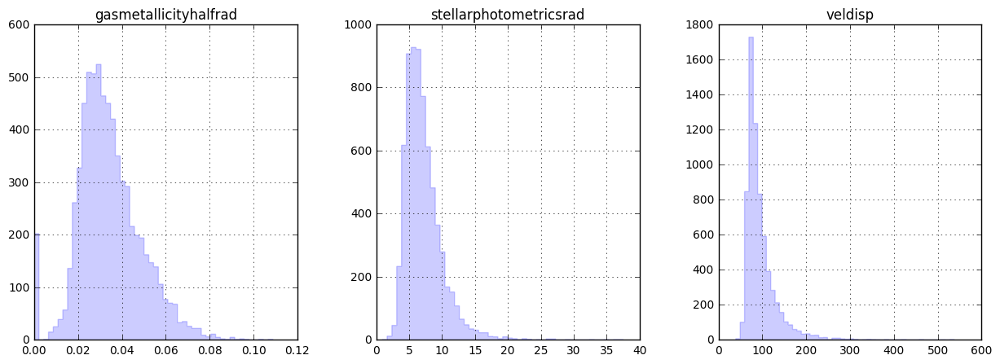

In [30]:
iwdaUniqueHaloDataFrame = iwdaHaloDataFrame.reset_index().drop_duplicates(subset='id', keep='last').set_index('id')
iwdaUniqueHaloDataFrame[['gasmetallicityhalfrad', 'veldisp', 'stellarphotometricsrad']].hist(bins=50, 
                                                                                             figsize=(15, 5),
                                                                                             layout=(1, 3),
                                                                                             histtype='step', 
                                                                                             fill=True, 
                                                                                             alpha=0.2)

Plot the distribution of stellar photometric radii with a logarithmic y-axis.

**Note**: The Illustris documentation specifies this field as: 
> Radius at which the surface brightness profile (computed from all member stellar particles) drops below the limit of $20.7\,{\rm mag\, arcsec}^{−22}$ in the K band (in comoving units).

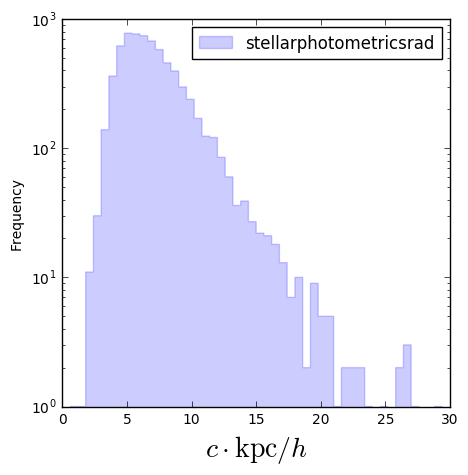

In [31]:
iwdaUniqueHaloDataFrame[['stellarphotometricsrad']].plot.hist(bins=50, 
                                                              range=(0, 30),
                                                              figsize=(5, 5),
                                                              logy=True, 
                                                              histtype='step', 
                                                              fill=True, 
                                                              alpha=0.2)
plt.xlabel(r'$c\cdot{\rm kpc}/h$', fontsize='20')

### Combined the full data with the prevously extracted metadata for each subhalo

In [32]:
fullMdhAndIwdaCombinedData = mdhAndIwdaCombinedData.merge(iwdaUniqueHaloDataFrame, 
                                                          how='left', 
                                                          left_index=True, 
                                                          right_index=True,
                                                          suffixes=("_metadata", "_fulldata"))
if verbose :
    display(fullMdhAndIwdaCombinedData.columns.values)
    display(fullMdhAndIwdaCombinedData)    

### Compute the stellar masses in units of $M_{\odot}$.

#### Transformation of  the simulated subhalo properties to enable comparison with observational counterparts
The units and scalings that characterize the Illustris data are optimized to enable analytical uniformity across redshift slices, however they are ot ideal for comparison with observational data at low reshifts.

The prescription outlined [here](http://ramon-1.wikispaces.com/Illustris) can be used to compute and plot the distribution of the stellar masses associated with each subhalo that has been classified in GalaxyZoo.

In [33]:
hubbleH = 0.74
fullMdhAndIwdaCombinedData['mass_stars_solar_units'] = np.log10(10**10*fullMdhAndIwdaCombinedData["mass_stars"]/hubbleH)

### Extract and plot the images that comprised the GalaxyZoo Illustris datasets
Extract and plot 20 random images from the `fixed_mass` and `fixed_view` subsamples.

In [34]:
fullMdhAndIwdaCombinedDataWithId = fullMdhAndIwdaCombinedData.reset_index().set_index('index', drop=False)

In [248]:
def plotFilteredSampleImages(numSamples, haloDataSource, dataFilter, titlePrefix) :
    filteredHaloDataSource = haloDataSource[dataFilter].reset_index(drop=True).reset_index()
    numFilteredElements = len(filteredHaloDataSource.index)
    extractedSampleMask = np.ones_like(filteredHaloDataSource.index.values, dtype=bool)
        
    plt.figure(figsize=(12, numSamples))
    subPlotNum = 1
    while subPlotNum < min(numFilteredElements, numSamples+1) :
        try :
            row = filteredHaloDataSource[extractedSampleMask][['level_0', 'supplementary_data', 'index', 'p_smooth', 'p_features', 'num_artifact', 'mass_stars_solar_units']].sample(1)
            extractedSampleMask[int(row['level_0'])] = False
            imageUrl = row['supplementary_data'].values[0]['stellar_mocks']['image_gz']
            haloId = row['index'].values[0] 
            pSmooth = row['p_smooth'].values[0] 
            pFeatures = row['p_features'].values[0] 
            nArtifact = row['num_artifact'].values[0]
            stellarMass = row['mass_stars_solar_units'].values[0]
            http = urllib3.PoolManager()
            if verbose :
                print('Attempting to download {}...'.format(imageUrl))
            resp = http.request('GET', imageUrl, headers = {'API-Key': '44ddc0a0574472a27514600007f1a6a1'})
            content = resp.data
            if resp.status != 200 :
                print('Could not retrieve image for HALO ID {} (Server status: {})'.format(haloId ,resp.status))
                numFilteredElements-=1
                continue
            fakeFile = io.BytesIO()
            fakeFile.write(content)
            plt.subplot(1 + numSamples/4, 4,subPlotNum)
            image = skimage.io.imread(fakeFile)
            plt.imshow(image)
            plt.title('{0} HALO: {1}\n P(S) = {2:.4f}, P(F) = {3:.4f}\n N(A) = {4}, M = {5:.4f}'.format(titlePrefix, haloId, pSmooth, pFeatures, nArtifact, stellarMass), fontsize=7)
            subPlotNum += 1
        except KeyError as error:
            print('Caught KeyError: {}'.format(error))
            continue

The titles of each subplot annotate, repectively:
* The `priority` label used to select the galaxy i.e. either `fixed_mass` or `fixed_view`.
* The Illustris Halo ID.
* $P(S)$: The fraction of *smooth* classification labels. Note that $P(F)=N(F)/(N(F) + N(S))$ i.e. *artifact* classifications are ignored.
* $P(F)$: The fraction of *featured* classification labels. Note that $P(S)=N(S)/(N(F) + N(S))$ i.e. *artifact* classifications are ignored.
* $N(A)$: The number of *artifact* classification labels.
* $M$: The base-10 logarithm of the galaxy's stellar mass in units of $M_{\odot}$

First randomly select 20 images from the `fixed_view` sample. Recall that this sample includes a single image from a wide range of **total** masses (with a correspondingly broad range of stellar masses).

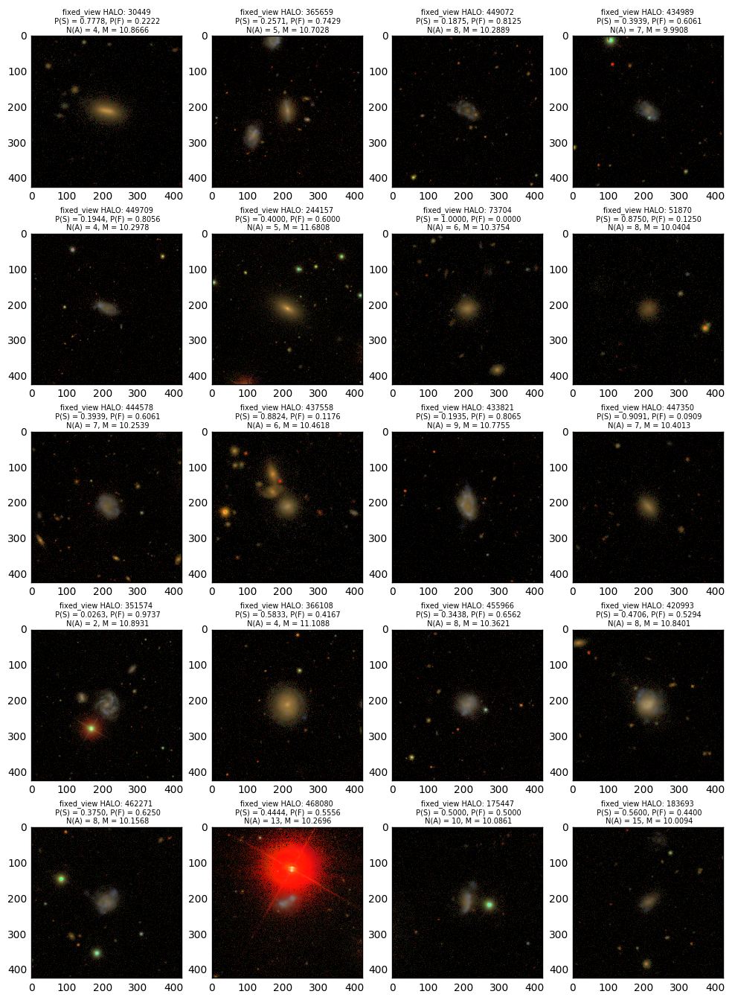

In [236]:
plotFilteredSampleImages(20, fullMdhAndIwdaCombinedDataWithId, lambda x: x['priority'] == 'fixed_view', 'fixed_view')

Now the `fixed_mass` subset.

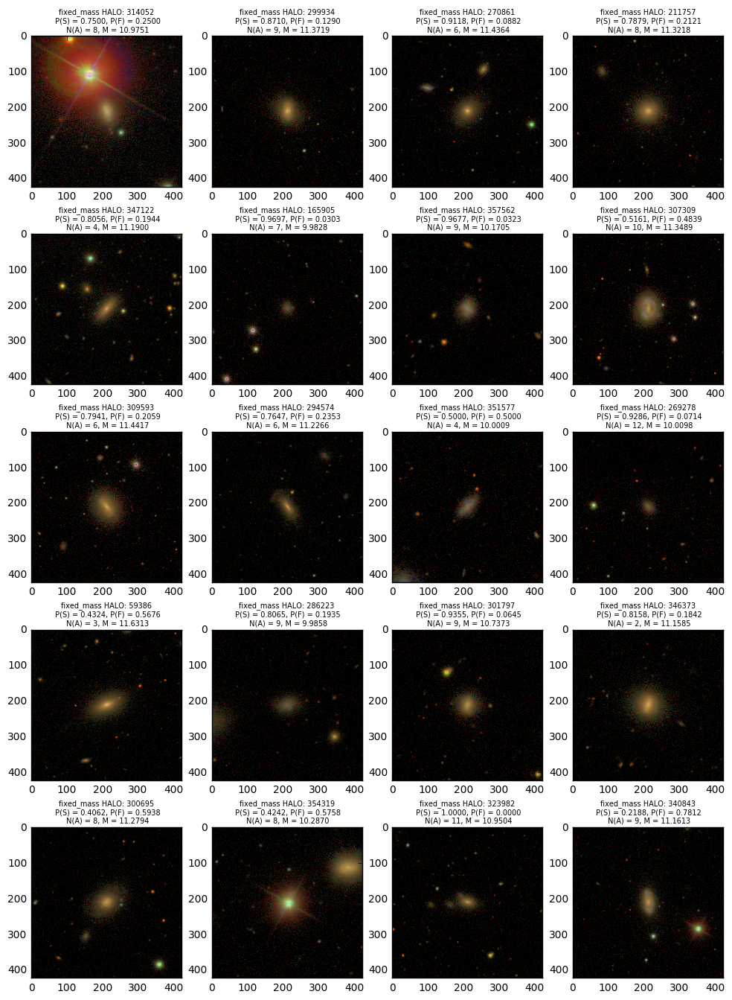

In [237]:
plotFilteredSampleImages(20, fullMdhAndIwdaCombinedDataWithId, lambda x: x['priority'] == 'fixed_mass', 'fixed_mass')

## Plot subsets of *featured* classified as *edge on* or *not edge on*
The assignment of the boolean-valued `is_edge_on` label to a subject is performed by `MongoDataLoader` for galaxies based on the Galaxy Zoo classification. A subject is defined to be *featured* if:
```python 
p_features > 0.6
```
The boolean-valued `is_features_and_edge_on` label is also computed by `MongoDataLoader` and represents is `True` only for those galaxies satistfying 
```python 
is_edge_on == True and p_features > 0.6
```

Separating edge on and inclined galaxies may be useful when studying the effect the absence of dust obscuration in the Illustris simulation has on classification results. 

### Start with the *featured and edge on* subset

Caught KeyError: 'image_gz'
Number of Halos with a majority of "edge on" classifications is 3229.
Number of Halos with p_features > 0.6 and a majority of "edge on" classifications is 269.


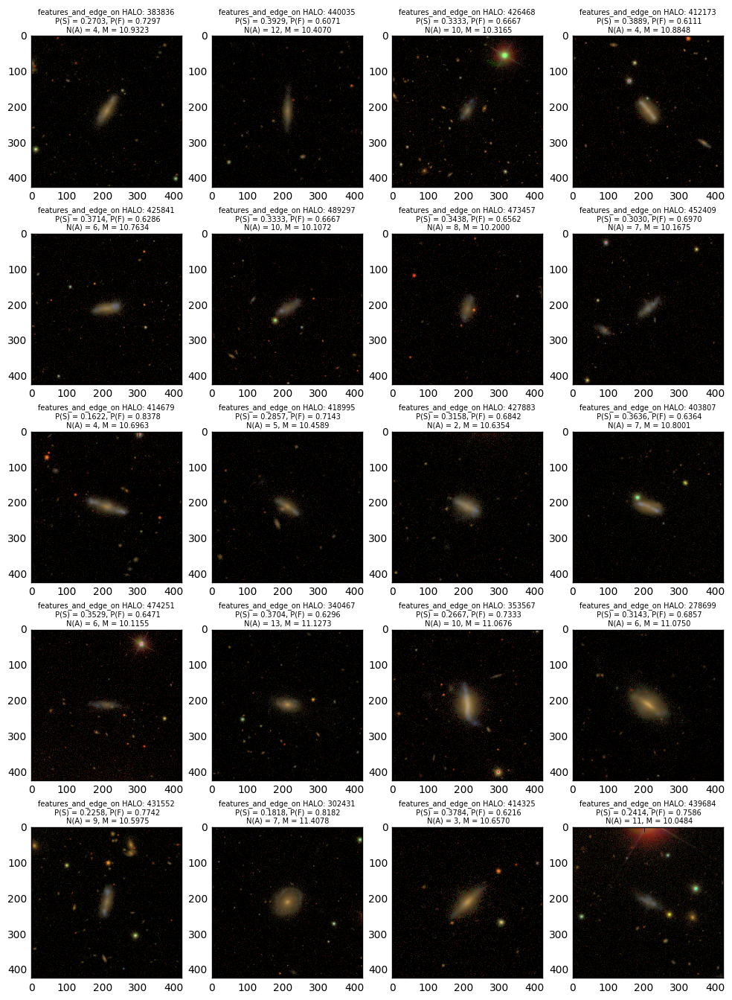

In [238]:
plotFilteredSampleImages(20, fullMdhAndIwdaCombinedDataWithId, lambda x: x['is_features_and_edge_on'], 'features_and_edge_on')
print ('Number of Halos with a majority of "edge on" classifications is {}.'.format(np.sum(fullMdhAndIwdaCombinedDataWithId['is_edge_on'].values)))
print ('Number of Halos with p_features > 0.6 and a majority of "edge on" classifications is {}.'.format(np.sum(fullMdhAndIwdaCombinedDataWithId['is_features_and_edge_on'].values)))


### Now the *featured and not edge on* subset

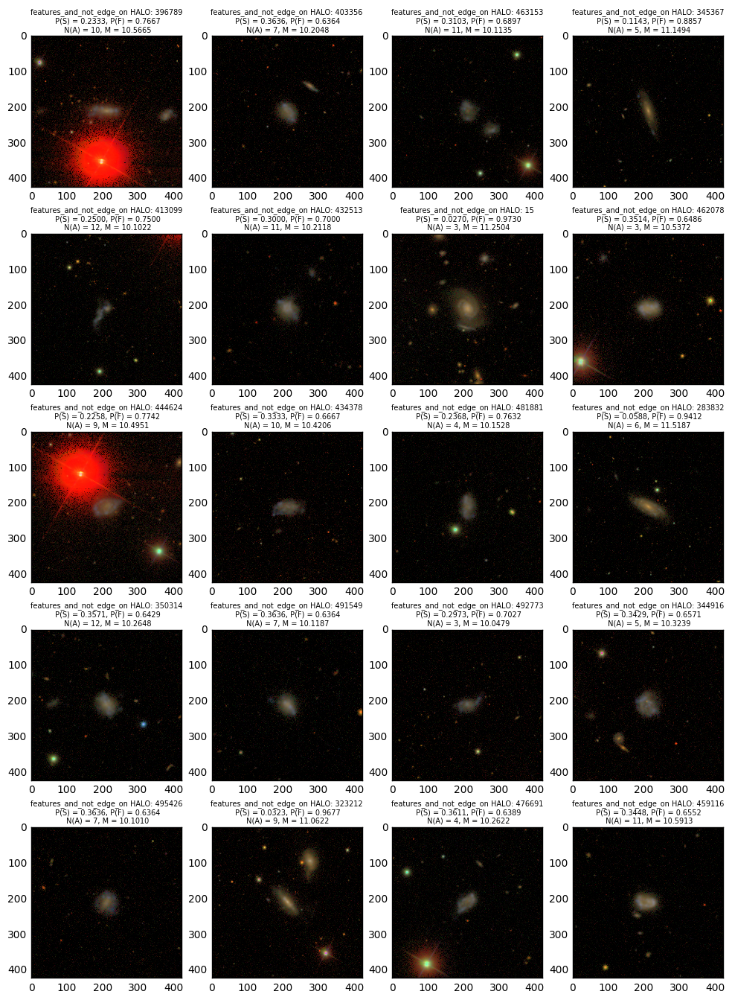

In [239]:
plotFilteredSampleImages(20, fullMdhAndIwdaCombinedDataWithId, lambda x: (~(x['is_edge_on']) & (x['p_features'] > 0.6)), 'features_and_not_edge_on')

### Create views of the dataframe for the `fixed_mass` , `fixed_view`, `edge_on`, and `not_edge_on` subsets
Having predefined views is merely a convenience. The selections are evaluated lazily when the data are accessed.

In [40]:
fullMdhAndIwdaCombinedDataViews = {'full' : fullMdhAndIwdaCombinedDataWithId,
                                   'fixed_mass' : fullMdhAndIwdaCombinedDataWithId[fullMdhAndIwdaCombinedDataWithId['priority'] =='fixed_mass'],
                                   'fixed_view' : fullMdhAndIwdaCombinedDataWithId[fullMdhAndIwdaCombinedDataWithId['priority'] =='fixed_view'],
                                   'fixed_view_and_first_fixed_mass' : fullMdhAndIwdaCombinedDataWithId[(fullMdhAndIwdaCombinedDataWithId['priority'] =='fixed_view') | (fullMdhAndIwdaCombinedDataWithId['priority'] =='first_fixed_mass')],
                                   'first_fixed_mass' : fullMdhAndIwdaCombinedDataWithId[fullMdhAndIwdaCombinedDataWithId['priority'] =='first_fixed_mass'],
                                   'edge_on' : fullMdhAndIwdaCombinedDataWithId[fullMdhAndIwdaCombinedDataWithId['is_edge_on']],
                                   'not_edge_on' : fullMdhAndIwdaCombinedDataWithId[(~fullMdhAndIwdaCombinedDataWithId['is_edge_on'])],
                                   'features_and_edge_on' : fullMdhAndIwdaCombinedDataWithId[fullMdhAndIwdaCombinedDataWithId['is_features_and_edge_on']]
                                  }

## Investigate the mapping between Illustris total and stellar mass selections

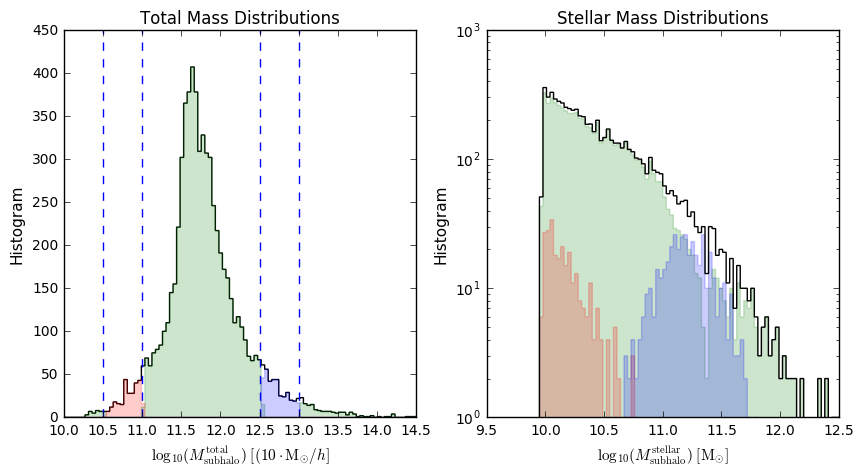

In [87]:
gc.collect()
massSelectionFigure = plt.figure(figsize=(10, 5))

lowCut = lambda dataFrame : (dataFrame['mass_log_msun'] > 10.5) & (dataFrame['mass_log_msun'] < 11.0) 
highCut = lambda dataFrame : (dataFrame['mass_log_msun'] > 12.5) & (dataFrame['mass_log_msun'] < 13.0) 

totalMassSubplot = plt.subplot(1,2,1)

fullMdhAndIwdaCombinedDataViews['fixed_view_and_first_fixed_mass']['mass_log_msun'].plot.hist(ax=totalMassSubplot, bins=100, range=(10,14.5), histtype='step', color='k', fill=False, label='mass_log_msun')
fullMdhAndIwdaCombinedDataViews['fixed_view']['mass_log_msun'].plot.hist(ax=totalMassSubplot, bins=100, range=(10,14.5), histtype='step', color='g', fc='g', fill=True, alpha=0.2, label='mass_log_msun')
fixedMassDataFrame = fullMdhAndIwdaCombinedDataViews['first_fixed_mass']
fixedMassDataFrame[lowCut(fixedMassDataFrame)]['mass_log_msun'].plot.hist(ax=totalMassSubplot, bins=100, range=(10,14.5), color='r', fc='r', histtype='step', fill=True, alpha=0.2, label='mass_log_msun')
fixedMassDataFrame[highCut(fixedMassDataFrame)]['mass_log_msun'].plot.hist(ax=totalMassSubplot, bins=100, range=(10,14.5), color='b', fc='b', histtype='step', fill=True, alpha=0.2, label='mass_log_msun')
plt.axvline(10.5, ls='dashed')
plt.axvline(11.0, ls='dashed')
plt.axvline(12.5, ls='dashed')
plt.axvline(13.0, ls='dashed')
plt.xlabel(r'$\log_{10}(M_{\rm subhalo}^{\rm total})\;[(10\cdot{\rm M_{\odot}}/h]$', fontsize=11)
plt.ylabel('Histogram', fontsize=11)
plt.title('Total Mass Distributions')

stellarMassSubplot = plt.subplot(1,2,2)

fullDataFrame = fullMdhAndIwdaCombinedDataViews['fixed_view_and_first_fixed_mass']
fixedViewDataFrame = fullMdhAndIwdaCombinedDataViews['fixed_view']

stellarMassesAll = fullDataFrame["mass_stars_solar_units"]
stellarMassesLowCut = fullDataFrame[lowCut(fullDataFrame)]["mass_stars_solar_units"]
stellarMassesHighCut = fullDataFrame[highCut(fullDataFrame)]["mass_stars_solar_units"]
stellarMassesFixedView = fixedViewDataFrame["mass_stars_solar_units"]

stellarMassesFixedView.plot.hist(bins=100, range=(9.5, 12.5), histtype='step', color='g', fc='g', fill=True, alpha=0.2, logy=True)
stellarMassesLowCut.plot.hist(bins=100, range=(9.5, 12.5), histtype='step', color='r', fc='r',fill=True, alpha=0.2, logy=True)
stellarMassesHighCut.plot.hist(bins=100, range=(9.5, 12.5), histtype='step', color='b', fc='b', fill=True, alpha=0.2, logy=True)
stellarMassesAll.plot.hist(bins=100, range=(9.5, 12.5), histtype='step', color='k', fill=False, logy=True)

plt.xlabel(r'$\log_{10}(M_{\rm subhalo}^{\rm stellar})\;[{\rm M_{\odot}}]$', fontsize=11)
plt.ylabel('Histogram', fontsize=11)
plt.title('Stellar Mass Distributions')

### Define convienent views isolating the `mass_stars_solar_units` column for various `priority` subsets

In [42]:
fullMdhAndIwdaCombinedDataStellarMasses = {'full' : fullMdhAndIwdaCombinedDataViews['full']['mass_stars_solar_units'],
                                           'fixed_mass' : fullMdhAndIwdaCombinedDataViews['fixed_mass']['mass_stars_solar_units'],
                                           'fixed_view' : fullMdhAndIwdaCombinedDataViews['fixed_view']['mass_stars_solar_units'],
                                           'fixed_view_and_first_fixed_mass' : fullMdhAndIwdaCombinedDataViews['fixed_view_and_first_fixed_mass']['mass_stars_solar_units']
                                          }

### Extra optional examination of stellar mass distributions

#### First plot the distribution for **all** subhalos (including the fixed_mass duplicates)

In [43]:
if sanityChecks :
    gc.collect()
    plt.figure(figsize=(5, 5))
    plt.suptitle('Both Fixed Mass and Fixed View Samples')
    logMassAxes = fullMdhAndIwdaCombinedDataStellarMasses['full'].plot.hist(bins=50, logy=True, histtype='step', fill=True, alpha=0.2)
    plt.xlabel(r'$\log_{10}(M_{\rm subhalo}^{\rm stellar})\;[{\rm M_{\odot}}]$', fontsize=15)

#### Now isolate the `fixed_view` sample.

In [44]:
if sanityChecks :
    plt.figure(figsize=(5, 5))
    plt.suptitle("Fixed View")
    logMassAxes = fullMdhAndIwdaCombinedDataStellarMasses['fixed_view'].plot.hist(bins=50, logy=True, histtype='step', fill=True, alpha=0.2)
    plt.xlabel(r'$\log_{10}(M_{\rm subhalo}^{\rm stellar})\;[{\rm M_{\odot}}]$', fontsize=15)

#### Now isolate the `fixed_mass` sample.

In [45]:
if sanityChecks :
    plt.figure(figsize=(5, 5))
    plt.suptitle("Fixed Mass")
    logMassAxes = fullMdhAndIwdaCombinedDataStellarMasses['fixed_mass'].plot.hist(bins=50, logy=True, histtype='step', fill=True, alpha=0.2)
    plt.xlabel(r'$\log_{10}(M_{\rm subhalo}^{\rm stellar})\;[{\rm M_{\odot}}]$', fontsize=15)

#### Finally plot the combined `fixed_view` and `first_fixed_mass` samples

In [46]:
if sanityChecks :
    plt.figure(figsize=(5, 5))
    plt.suptitle("Fixed view and first fixed mass")
    logMassAxes = fullMdhAndIwdaCombinedDataStellarMasses['fixed_view_and_first_fixed_mass'].plot.hist(bins=50, logy=True, histtype='step', fill=True, alpha=0.2)
    plt.xlabel(r'$\log_{10}(M_{\rm subhalo}^{\rm stellar})\;[{\rm M_{\odot}}]$', fontsize=15)

# Comparisons between Illustris and SDSS Galaxies in Galaxy Zoo

### Retrieve data for all SDSS galaxies that were classified in GalaxyZoo 2 and have 0.04 < z < 0.06
**Notes**:
The SDSS database lists numerous measurements and derived estimates of the **apparent** magnitude for many galaxies in its dataset. Here the magnitude computed within the **petrosian** radius in each of the SDSS bands (u,g,r,i,z) is used.

Apparent magnitudes are converted to an **absolute** magnitude using the function `fCosmoAbsMag` provided by the SDSS database server. Default values are used for the cosmological description which correspoond with WMAP-5 values. In contrast, the Illustris simulation framework assumes the WMAP-9 values for its cosmological simulation. Since the selected galaxies all have 0.04 < z < 0.06 and the zero-redshift slice of the Illustris simulation was used, this discrepancy should not be problematic.

Vote fraction "probabilities" derived from GalaxyZoo classifications are also extracted for all galaxies.

### Query the CasJobs interface to retrieve physical parameter estimates derived from observation

In [47]:
from CasJobsDataLoader import CasJobsDataLoader
cjdl = CasJobsDataLoader('97b03351f7444cd580556373862ff407')
cjdl.printUserManagerUserName()

hughdickinson


In [48]:
if saveCasJobsSdssData :
    cjdlSdssDataFrame = cjdl.getSDSSData()
    cjdl.saveSDSSData()
else :
    cjdlSdssDataFrame = cjdl.loadSDSSData()

In [51]:
if verbose :
    display(cjdlSdssDataFrame)

## Compute the axial ratios and implied inclinations of SDSS galaxies
These values can be used to compare with Illustris galaxies for which `is_edge_on` is `True` and to determine how the citizen-scientist's perception of a galaxy's inclination maps to a quantitative axial ratio measurement.

### Determine which fit to each Galaxy's profile (if available) is prefered by thresholding on `deVFrac_*`
The CasJobs SkyServer's `Galaxy` *view* lists galaxy axial ratios that are computed by fitting two alternative *profile functions* to each galaxy's surface brightness distribution in each of the SDSS spectral bands (u, g, r, i, z):
1. A [de Vaucouleurs profile](https://en.wikipedia.org/wiki/De_Vaucouleurs%27_law) that models the surface brightness profiles of elliptical galaxies or the bulge components of galaxies with mixed morphology.
2. An exponential profile that models the surface brightness profiles of (thin disk) spiral galaxies or the disk components of galaxies with mixed morphology.

For each SDSS band , the `Galaxy` *view* also lists a quantity `deVFrac_*` (where * is `u`, `g`, `r`, `i` or `z`) which is derived by fitting a compound exponential-plus-de-Vaucouleurs model and determining the required fractional contribution of the de Vaucouleurs component. If this fraction exceeds 0.5 then the galaxy is considered bulge-dominated and the axial ratio (A/B) determined from the pure de Vaucouleurs fit is adopted, otherwise it is considered disk dominated and the axial ratio determined from the pure exponential fit is used.

The *inclination* of a galaxy can be estimated as $\theta_{i}=1 - \cos^{-1}(A/B)$.

Add some computed columns to the SDSS data table for the preferred axial ratio value in each SDSS band as well as corresponding inclination values in radians and degrees.

In [52]:
for filterName in 'ugriz' :
    cjdlSdssDataFrame['preferredAB_' + filterName] = [ row['deVAB_' + filterName] if (row['fracDeV_' + filterName] > 0.5 or np.isnan(row['fracDeV_' + filterName])) else row['expAB_' + filterName] for _,row in cjdlSdssDataFrame.iterrows() ] 
    cjdlSdssDataFrame['inclinationRad_' + filterName] = 1.0 - np.arccos(cjdlSdssDataFrame['preferredAB_' + filterName])
    cjdlSdssDataFrame['inclinationDeg_' + filterName] = np.rad2deg(cjdlSdssDataFrame['inclinationRad_' + filterName])

### Plot distributions of A/B in all SDSS bands

In [54]:
if sanityChecks:
    gc.collect()

    abRatioDistFigure = plt.figure(figsize=(15, 10))
    abRatioDistFigure.suptitle('Distribution of Major-to-Minor axis ratios for preferred galaxy profile fit')

    for index, filterName in enumerate('ugriz') :
        subplotAxis = plt.subplot(3, 2, index+1)
        cjdlSdssDataFrame['preferredAB_' + filterName].plot.hist(bins=100, histtype='step', fill=True, alpha=0.2)
        lines, labels = subplotAxis.get_legend_handles_labels()
        labels = ['SDSS A/B ' + str(filterName.upper())]
        subplotAxis.legend(lines[:1], labels[:1], loc='best',fontsize='medium')
        plt.xlabel("A/B")

### Plot a random sample of cutout images for likely edge-on (A/B$\rightarrow$0) and face-on (A/B$\rightarrow$1) galaxies

In [58]:
def plotSDSSFilteredSampleImages(numSamples, sdssDataSource, dataFilter, titlePrefix) :
    width=500
    height=500
    pixelsize=0.396 # SDSS pixel scale?
    subPlotNum = 1
    #abRatioCut = cjdlSdssDataFrame['preferredAB_g'] < 0.3

    plt.figure(figsize=(12, numSamples))
    
    for index, galData in sdssDataSource[dataFilter(sdssDataSource)].sample(numSamples).iterrows():
        # the 'scale' parameter is set so that the image will be about 2x the size of the galaxy
        scale=2.0*galData['petror90_r']/pixelsize/width
        # form url to query SDSS web sevice to generate cutout image
        cutOutImageUrl="http://skyservice.pha.jhu.edu/DR12/ImgCutout/getjpeg.aspx?ra=" + str(galData['ra'])
        cutOutImageUrl += "&dec=" + str(galData['dec']) + "&scale=""" + str(scale) + "&width=" + str(width)
        cutOutImageUrl += "&height=" + str(height)
        # retrieve 
        cutoutImage=skimage.io.imread(cutOutImageUrl)
        plt.subplot(1 + numSamples/4, 4,subPlotNum)
        subPlotNum += 1
        plt.imshow(cutoutImage)
        # show the object identifier (objId) above the image.
        plt.title(titlePrefix + ('\n' if titlePrefix else '') + 'SDSS ID: ' + str(galData['dr8objid']), size='small')

#### Edge on first
Use A/B < 0.3 as the selection criterion

In [60]:
if sanityChecks:
    plotSDSSFilteredSampleImages(20, cjdlSdssDataFrame, lambda x  : x['preferredAB_g'] < 0.3, 'Edge-on')

#### Now face-on
Use A/B > 0.7 as the selection criterion

In [63]:
if sanityChecks:
    plotSDSSFilteredSampleImages(20, cjdlSdssDataFrame, lambda x  : x['preferredAB_g'] > 0.7, 'Face-on')

### Now plot A/B versus vote fractions for edge_on and not_edge_on 

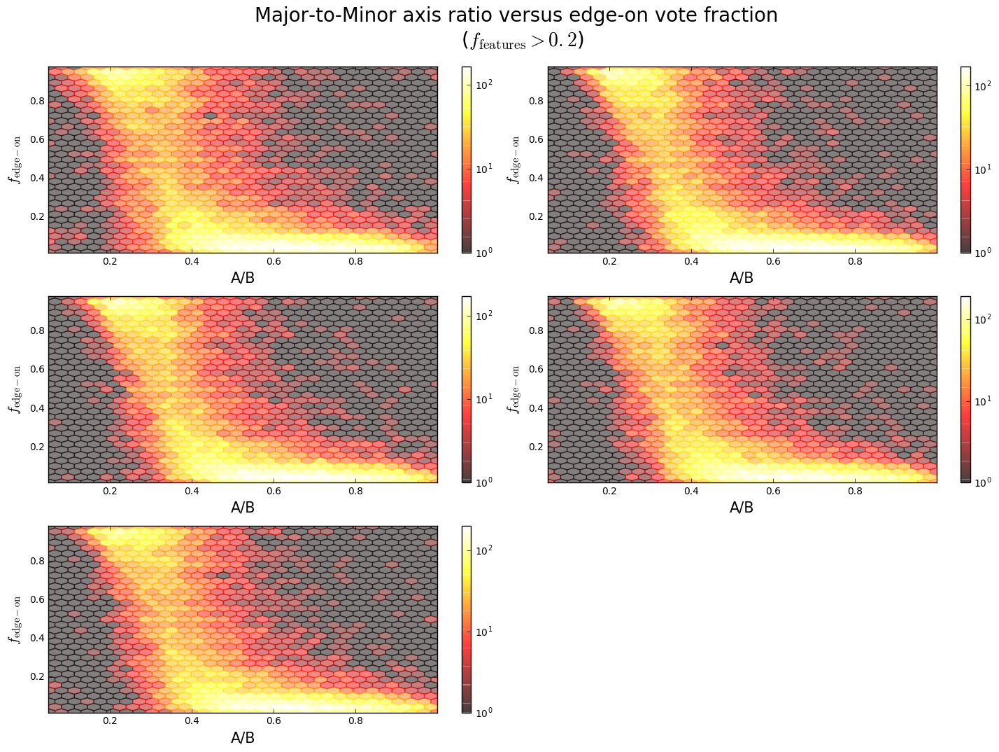

In [65]:
gc.collect()

abRatioDistFigure = plt.figure(figsize=(15, 10))

for index, filterName in enumerate('ugriz') :
    subplotAxis = plt.subplot(3, 2, index+1)
    cut = (cjdlSdssDataFrame['t01_smooth_or_features_a02_features_or_disk_fraction'] > 0.2) & (cjdlSdssDataFrame['t02_edgeon_a04_yes_fraction'] > 0) & (cjdlSdssDataFrame['t02_edgeon_a04_yes_fraction'] < 1)
    cjdlSdssDataFrame[cut].dropna().plot.hexbin(ax=subplotAxis, x='preferredAB_' + filterName, y='t02_edgeon_a04_yes_fraction', gridsize=30, cmap='hot', alpha=0.5, label='SDSS ' + str(filterName.upper()), sharex=False, norm=matplotlib.colors.LogNorm())
    plt.xlabel(r"A/B", size=15)
    plt.ylabel(r"$f_{\rm edge-on}$", size=15)
    plt.tight_layout()

abRatioDistFigure.suptitle('Major-to-Minor axis ratio versus edge-on vote fraction \n ($f_{\\rm features} > 0.2$)', y=1.07, size=20)

## Direct comparison between SDSS and Illustris GZ Sample Mass Distributions

Comparison between the distribution of subhalo **stellar** masses from the GZ Illustris sample and the distributions of estimated **stellar** masses contained within the 50%, 84% and 97.5% **Petrosian** radii (denoted $R_{50}$, $R_{84}$, and $R_{97.5}$ on the plotted distribution axes) of the entire Galaxy Zoo II SDSS sample.

### SDSS and Illustris data selection criteria
Change the subsequent variables to restrict sampling to a particular subset of the Galaxy Zoo dataset and define a narrow cut in redshift.

In [75]:
illustrisSampleSubset = 'fixed_view_and_first_fixed_mass'
illustrisSampleSubsetForVoteFrac = lambda dataset : (dataset['priority'] == 'fixed_view') | (dataset['priority'] == 'first_fixed_mass')
gzSampleRedshiftCut = lambda dataset : ((dataset['z'] > 0.045) & (dataset['z'] < 0.055)) 

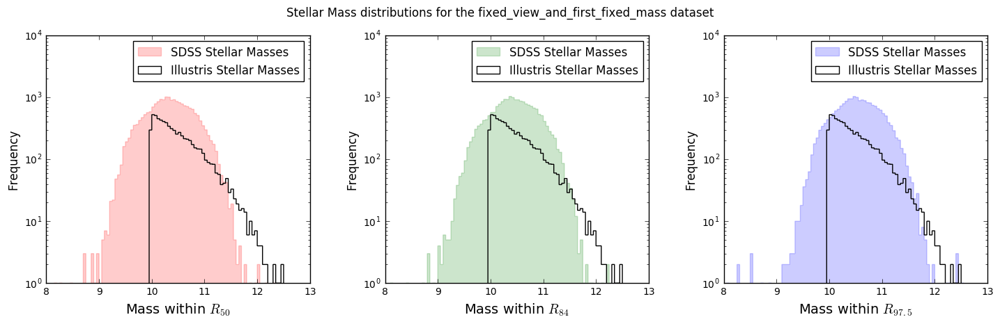

In [151]:
gc.collect()
massCompSloanIlustrisPlots=plt.figure(figsize=(15, 5))

massCompSloanIlustrisPlots.suptitle('Stellar Mass distributions for the ' + illustrisSampleSubset + ' dataset', fontsize=12)

massInPercentageRadiusColumns = { 50 : 'lgm_tot_p50', 84 : 'lgm_tot_p84', 97.5 : 'lgm_tot_p97p5'}

for index, element in enumerate(sorted(massInPercentageRadiusColumns.items())) :
    percentageOfRadius, massInPercentageRadiusColumn = element
    
    axes = massCompSloanIlustrisPlots.add_subplot(1,len(massInPercentageRadiusColumns),index+1)
    
    sdssFullCut = ((gzSampleRedshiftCut(cjdlSdssDataFrame)) & (cjdlSdssDataFrame[massInPercentageRadiusColumn] > -100))
    sdssPlotData = cjdlSdssDataFrame[sdssFullCut][massInPercentageRadiusColumn]
    
    sdssPlotData.plot.hist(ax=axes, histtype='step', color=unifiedTriColourMap[index], fill=True, fc=unifiedTriColourMap[index], alpha=0.2, logy=True, bins=100, range=(8,13))
    fullMdhAndIwdaCombinedDataStellarMasses[illustrisSampleSubset].plot.hist(ax=axes, histtype='step', bins=100, range=(8,13), logy=True, alpha=1, color='k')

    axes.set_xlabel(r'Mass within $R_{}$'.format('{' + str(percentageOfRadius) + '}'), fontsize=14)
    axes.set_ylabel(r'Frequency', fontsize=12)
    lines, labels = axes.get_legend_handles_labels()
    labels = [ 'SDSS Stellar Masses', 'Illustris Stellar Masses']
    axes.legend(lines, labels)
plt.tight_layout(pad=3)

## Bootstrap *from* the Illustris sample to match the *mass* distribution *of* the SDSS dataset
Randomly resample from the Illustris sample to match the SDSS mass distribution for $M>10^{10}\,{\rm M_{\odot}}$. Resampling uses custom-built `SimpleAcceptReject` class defined in `PandasResampling` module.

In [135]:
gc.collect()

illustrisToSdssResampledFrames = {}
for index, element in enumerate(sorted(massInPercentageRadiusColumns.items())) :
    percentageOfRadius, massInPercentageRadiusColumn = element
    
    print('Resampling from Illustris to match distribution mass within {}% of the Petrosian radius for SDSS:'.format(percentageOfRadius))
        
    sdssFullCut = ((gzSampleRedshiftCut(cjdlSdssDataFrame)) & (cjdlSdssDataFrame[massInPercentageRadiusColumn] > 10))
    sdssData = cjdlSdssDataFrame[sdssFullCut]
    
    illustrisData = fullMdhAndIwdaCombinedDataViews[illustrisSampleSubset]

    bootStrapper = SimpleAcceptReject(sdssData,
                                      illustrisData,
                                      100, 
                                      massInPercentageRadiusColumn,
                                      'mass_stars_solar_units',
                                      10)

    illustrisToSdssResampledFrames.update({ percentageOfRadius : bootStrapper.getResampledDataset() })
    if verbose :
        display (illustrisToSdssResampledFrames[percentageOfRadius])

Resampling from Illustris to match distribution mass within 50% of the Petrosian radius for SDSS:
Generating probability disribution for sample...
Generating probability disribution for target...
Generating resampled distribution...
Done.
Resampling from Illustris to match distribution mass within 84% of the Petrosian radius for SDSS:
Generating probability disribution for sample...
Generating probability disribution for target...
Generating resampled distribution...
Done.
Resampling from Illustris to match distribution mass within 97.5% of the Petrosian radius for SDSS:
Generating probability disribution for sample...
Generating probability disribution for target...
Generating resampled distribution...
Done.


## Bootstrap *from* the SDSS dataset to match the *mass* distribution *of* the Illustris dataset

In [139]:
gc.collect()

sdssToIllustrisResampledFrames = {}
for index, element in enumerate(sorted(massInPercentageRadiusColumns.items())) :
    percentageOfRadius, massInPercentageRadiusColumn = element
    
    print('Resampling from SDSS distribution of mass within {}% of the Petrosian radius to match Illustris:'.format(percentageOfRadius))
        
    # Sample from an appropriate sub-selection of the SDSS dataset
    sdssFullCut = ((gzSampleRedshiftCut(cjdlSdssDataFrame)) & (cjdlSdssDataFrame[massInPercentageRadiusColumn] > 10))
    sdssData = cjdlSdssDataFrame[sdssFullCut]
    
    illustrisData = fullMdhAndIwdaCombinedDataViews[illustrisSampleSubset]

    bootStrapper = SimpleAcceptReject(illustrisData,
                                      sdssData,
                                      100, 
                                      'mass_stars_solar_units',
                                      massInPercentageRadiusColumn,
                                      10)

    sdssToIllustrisResampledFrames.update({ percentageOfRadius : bootStrapper.getResampledDataset() })
    if verbose :
        display (sdssToIllustrisResampledFrames[percentageOfRadius])

Resampling from SDSS distribution of mass within 50% of the Petrosian radius to match Illustris:
Generating probability disribution for sample...
Generating probability disribution for target...
Generating resampled distribution...
Done.
Resampling from SDSS distribution of mass within 84% of the Petrosian radius to match Illustris:
Generating probability disribution for sample...
Generating probability disribution for target...
Generating resampled distribution...
Done.
Resampling from SDSS distribution of mass within 97.5% of the Petrosian radius to match Illustris:
Generating probability disribution for sample...
Generating probability disribution for target...
Generating resampled distribution...
Done.


## Overplot the boostrapped distributions and their target distributions
First the resampling (oversampling) **from Illustris** to match SDSS.

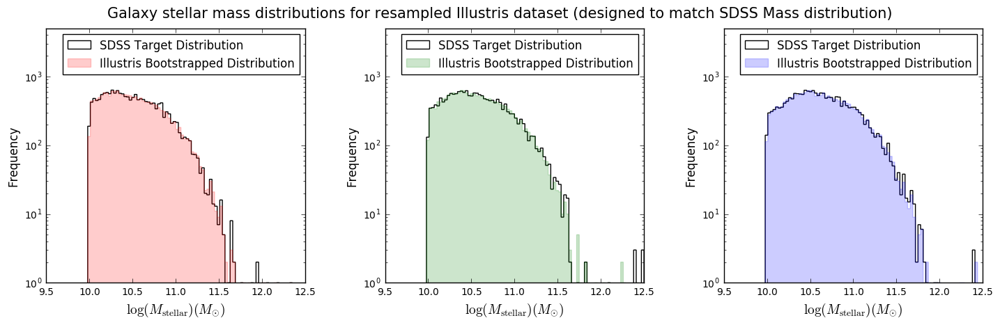

In [137]:
massCompResampledSloanIlustrisPlots=plt.figure(figsize=(15, 5))

massCompResampledSloanIlustrisPlots.suptitle(r'Galaxy stellar mass distributions for resampled Illustris dataset (designed to match SDSS Mass distribution)', size=15)

for index, element in enumerate(sorted(illustrisToSdssResampledFrames.items())) :
    percentageOfRadius, resampledFrame = element
    massInPercentageRadiusColumn = massInPercentageRadiusColumns[percentageOfRadius]
    
    axes = massCompResampledSloanIlustrisPlots.add_subplot(1,len(massInPercentageRadiusColumns),index+1)
    
    sdssFullCut = ((gzSampleRedshiftCut(cjdlSdssDataFrame)) & (cjdlSdssDataFrame[massInPercentageRadiusColumn] > 10))
    sdssPlotData = cjdlSdssDataFrame[sdssFullCut][massInPercentageRadiusColumn]
        
    resampledFrame['mass_stars_solar_units'].plot.hist(ax=axes, histtype='step', bins=100, range=(9.5, 12.5), logy=True, alpha=1, color='k')
    sdssPlotData.plot.hist(ax=axes, histtype='step', color=unifiedTriColourMap[index], fill=True, fc=unifiedTriColourMap[index], alpha=0.2, logy=True, bins=100, range=(9.5, 12.5))

    (r'Mass within $R_{}$'.format('{' + str(percentageOfRadius) + '}'))
    axes.set_ylim(1, 5e3)
    axes.set_xlabel(r'$\log(M_{\rm stellar}) (M_{\odot})$', fontsize=14)
    axes.set_ylabel(r'Frequency', fontsize=12)
    lines, labels = axes.get_legend_handles_labels()
    labels = [ 'SDSS Target Distribution', 'Illustris Bootstrapped Distribution']
    axes.legend(lines, labels)
plt.tight_layout(pad=3)

Now the resampling **from SDSS** to match Illustris.

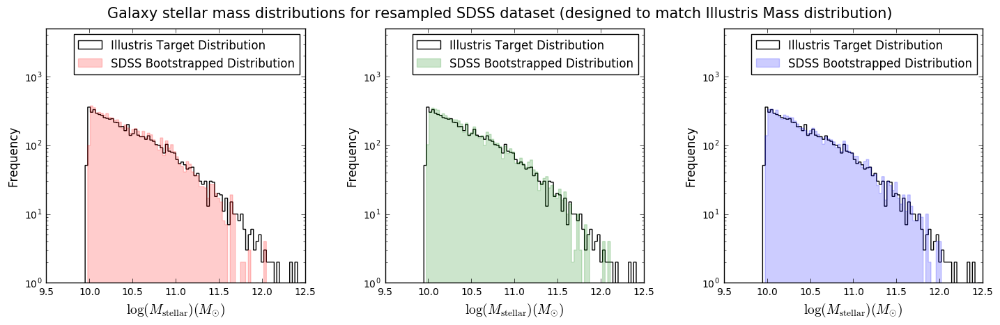

In [147]:
massCompResampledIlustrisSloanPlots=plt.figure(figsize=(15, 5))

massCompResampledIlustrisSloanPlots.suptitle(r'Galaxy stellar mass distributions for resampled SDSS dataset (designed to match Illustris Mass distribution)', size=15)

for index, element in enumerate(sorted(sdssToIllustrisResampledFrames.items())) :
    percentageOfRadius, resampledFrame = element
    massInPercentageRadiusColumn = massInPercentageRadiusColumns[percentageOfRadius]
    
    axes = massCompResampledIlustrisSloanPlots.add_subplot(1,len(massInPercentageRadiusColumns),index+1)
    
    illustrisData = fullMdhAndIwdaCombinedDataViews[illustrisSampleSubset]

    illustrisData['mass_stars_solar_units'].plot.hist(ax=axes, histtype='step', bins=100, range=(9.5, 12.5), logy=True, alpha=1, color='k')
    resampledFrame[massInPercentageRadiusColumn].plot.hist(ax=axes, histtype='step', color=unifiedTriColourMap[index], fill=True, fc=unifiedTriColourMap[index], alpha=0.2, logy=True, bins=100, range=(9.5, 12.5))

    (r'Mass within $R_{}$'.format('{' + str(percentageOfRadius) + '}'))
    axes.set_ylim(1, 5e3)
    axes.set_xlabel(r'$\log(M_{\rm stellar}) (M_{\odot})$', fontsize=14)
    axes.set_ylabel(r'Frequency', fontsize=12)
    lines, labels = axes.get_legend_handles_labels()
    labels = [ 'Illustris Target Distribution', 'SDSS Bootstrapped Distribution']
    axes.legend(lines, labels)
plt.tight_layout(pad=3)

**Evidently (and as would be expected) the best match is achieved by resampling from the distribution the maxiumum percentage (97.5%) of the Petrosian radius.** Define this as the prefered data set for all subsequent analysis

In [340]:
preferredPercentageOfRadius = 97.5
massInPercentageRadiusColumn = massInPercentageRadiusColumns[preferredPercentageOfRadius]
sdssToIllustrisResampledData = sdssToIllustrisResampledFrames[preferredPercentageOfRadius]
sdssDataSets = {'raw' : cjdlSdssDataFrame, 
                'resampled' : sdssToIllustrisResampledData
               }

## Plot the distributions of vote fraction for the resampled dataset
First plot distribution of the number of artifact classifications for **Illustris**.

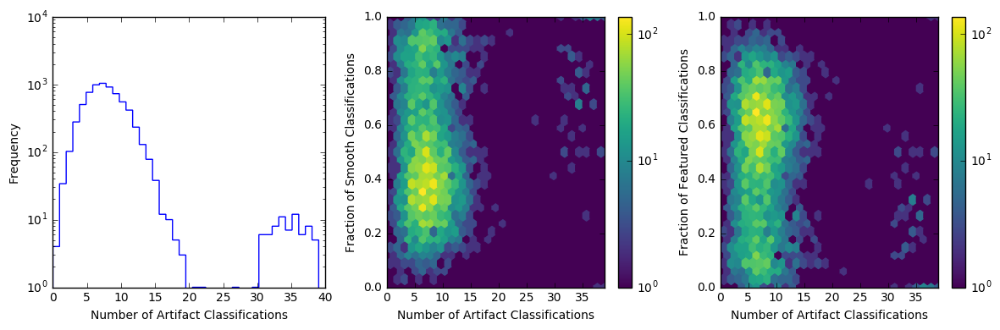

In [203]:
gc.collect()

numArtifactDistsFigure = plt.figure(figsize=(12,4))
numArtifactDistAxes = numArtifactDistsFigure.add_subplot(1,3,1)
fullMdhAndIwdaCombinedDataViews[illustrisSampleSubset]['num_artifact'].plot.hist(ax=numArtifactDistAxes, bins=40, histtype='step', fill=False, sharex=False, logy=True)
numArtifactForSmoothAxes = numArtifactDistsFigure.add_subplot(1,3,2)
fullMdhAndIwdaCombinedDataViews[illustrisSampleSubset].plot.hexbin(x='num_artifact', y='p_smooth', ax=numArtifactForSmoothAxes, gridsize=30, cmap='viridis', sharex=False, norm=matplotlib.colors.LogNorm())
numArtifactForFeaturesAxes = numArtifactDistsFigure.add_subplot(1,3,3)
fullMdhAndIwdaCombinedDataViews[illustrisSampleSubset].plot.hexbin(x='num_artifact', y='p_features', ax=numArtifactForFeaturesAxes, gridsize=30, cmap='viridis', sharex=False, norm=matplotlib.colors.LogNorm())

numArtifactDistAxes.set_xlabel('Number of Artifact Classifications')
numArtifactForSmoothAxes.set_xlabel('Number of Artifact Classifications')
numArtifactForSmoothAxes.set_ylabel('Fraction of Smooth Classifications')
numArtifactForFeaturesAxes.set_xlabel('Number of Artifact Classifications')
numArtifactForFeaturesAxes.set_ylabel('Fraction of Featured Classifications')

plt.tight_layout()

Now make equvalent plots for the **resampled SDSS** dataset.

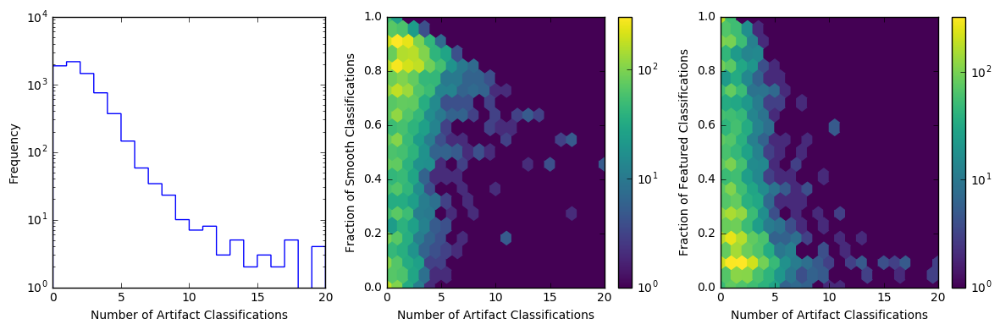

In [341]:
gc.collect()

numArtifactDistsFigure = plt.figure(figsize=(12,4))
numArtifactDistAxes = numArtifactDistsFigure.add_subplot(1,3,1)
sdssDataSets['resampled']['t01_smooth_or_features_a03_star_or_artifact_count'].plot.hist(ax=numArtifactDistAxes, bins=20, histtype='step', fill=False, sharex=False, logy=True)
numArtifactForSmoothAxes = numArtifactDistsFigure.add_subplot(1,3,2)
sdssDataSets['resampled'].plot.hexbin(x='t01_smooth_or_features_a03_star_or_artifact_count', y='t01_smooth_or_features_a01_smooth_fraction', ax=numArtifactForSmoothAxes, gridsize=20, cmap='viridis', sharex=False, norm=matplotlib.colors.LogNorm())
numArtifactForFeaturesAxes = numArtifactDistsFigure.add_subplot(1,3,3)
sdssDataSets['resampled'].plot.hexbin(x='t01_smooth_or_features_a03_star_or_artifact_count', y='t01_smooth_or_features_a02_features_or_disk_fraction', ax=numArtifactForFeaturesAxes, gridsize=20, cmap='viridis', sharex=False, norm=matplotlib.colors.LogNorm())

numArtifactDistAxes.set_xlabel('Number of Artifact Classifications')
numArtifactForSmoothAxes.set_xlabel('Number of Artifact Classifications')
numArtifactForSmoothAxes.set_ylabel('Fraction of Smooth Classifications')
numArtifactForFeaturesAxes.set_xlabel('Number of Artifact Classifications')
numArtifactForFeaturesAxes.set_ylabel('Fraction of Featured Classifications')

plt.tight_layout()

#### Remarks
1. The Illustris classification data reveal a bimodality in the distribution of artifact classifications, which is not seen in the SDSS classification data.
2. In contrast with the SDSS classifications, very few Illustris subjects have a number of artifact classifications $N(A) = 0$. This may indicate some level of malicious classify-simulations-as-atifacts behaviour.
3. The typical number of artifact classifications is small ($N(A)\lesssim 5$) for most Illustris subjects. See below for representative images of subjects with artifact classification counts $N(A)> 25$.
4. The total number of Galaxies with artifact classification counts $N(A)> 25$ is negligible in comparison to the number with $N(A) < 20$.
5. Given the small number of artifact classifications in both datasets the vote fractions for *smooth* and *featured* encode almost identical information and subsequent distribution comparison plots will focus on the the *smooth* vote fraction.

### Representative images for Illustris subjects with *artifact* classification counts $N(A)> 25$

The total number of Illustris subjects with artifact classification counts > 25 is 71
Could not retrieve image for HALO ID 41166 (Server status: 404)
Could not retrieve image for HALO ID 42 (Server status: 404)
Could not retrieve image for HALO ID 41182 (Server status: 404)
Could not retrieve image for HALO ID 49 (Server status: 404)
Could not retrieve image for HALO ID 34 (Server status: 404)


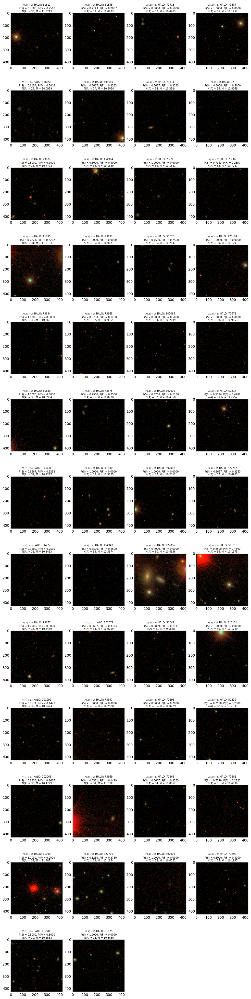

In [252]:
gc.collect()

numArtifactSelection = (fullMdhAndIwdaCombinedDataViews[illustrisSampleSubset]['num_artifact'] > 25)
numPassingNumArtifactSelection = len(fullMdhAndIwdaCombinedDataViews[illustrisSampleSubset][numArtifactSelection].index)
print('The total number of Illustris subjects with artifact classification counts > 25 is {}'.format(numPassingNumArtifactSelection))
plotFilteredSampleImages(50, fullMdhAndIwdaCombinedDataViews[illustrisSampleSubset], lambda x: x['num_artifact'] > 25, '$N(A) > 25$')

#### Remarks
1. Almost all subjects with artifact classification counts $N(A) > 25$ correspond with subjects that are (inexplicably) blank. There is no evidence of malicious artifact identification for $N(A) > 25$.
2. Even for these obvious artifacts, the values of P(S) and P(F) indicate that some classifiers assigned a *smooth* or *featured* label!

### Resampled: Comparitive plot of the *smooth* vote fraction for all stellar masses

In [365]:
sdssDataSet = 'resampled'

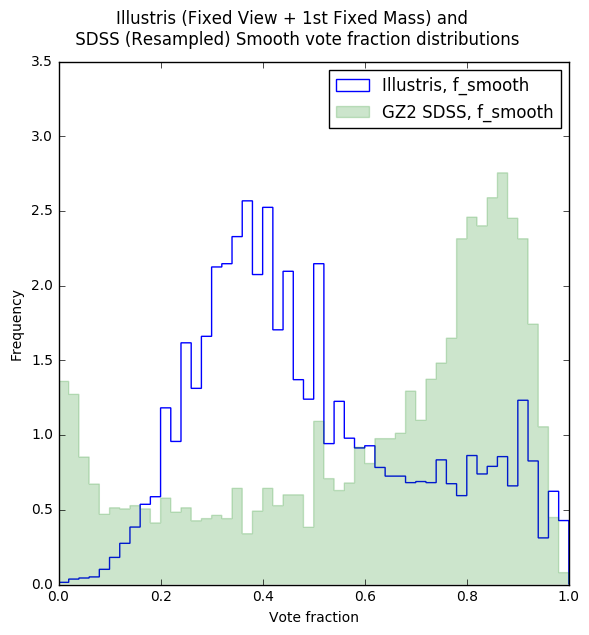

In [366]:
gc.collect()

smoothVoteFracFigure = plt.figure(figsize=(6,6))

sdssSelectedData = sdssDataSets[sdssDataSet]
illustrisSelectedData = fullMdhAndIwdaCombinedDataViews[illustrisSampleSubset]

axes = smoothVoteFracFigure.gca()

illustrisSelectedData['p_smooth'].plot.hist(ax=axes, bins=50, histtype='step', fill=False, alpha=1, normed=True, range=(0,1))
sdssSelectedData['t01_smooth_or_features_a01_smooth_fraction'].plot.hist(ax=axes, bins=50, histtype='step', logy=False, fill=True, alpha=0.2, normed=True, range=(0,1))

axes.set_xlabel('Vote fraction')
axes.set_ylim(0, 3.5)
lines, labels = axes.get_legend_handles_labels()
labels = [r'Illustris, f_smooth', 'GZ2 SDSS, f_smooth']
axes.legend(lines[:2], labels[:2], loc='best')
    
plt.suptitle('Illustris (Fixed View + 1st Fixed Mass) and \n SDSS ({}) Smooth vote fraction distributions'.format(sdssDataSet[0].upper() + sdssDataSet[1:]), y=1.05, size='large')
plt.tight_layout()

### Resampled: Comparitive plots of the *smooth* vote fraction for stellar mass subsets bounded from *below*

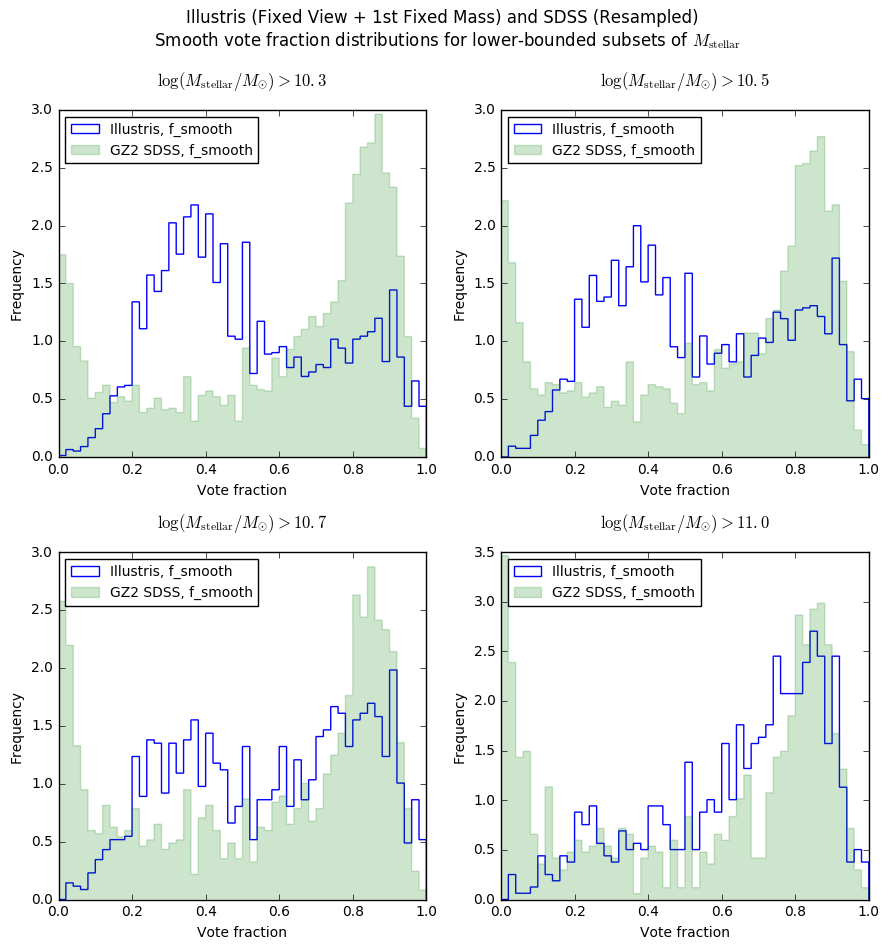

In [367]:
gc.collect()

logStellarMassLowerBounds = [10.3,10.5,10.7,11.0]

lowerBoundVoteFracFigure = plt.figure(figsize=(9,9))

for index, logStellarMassLowerBound in enumerate(logStellarMassLowerBounds) :
    sdssDataSelection = (sdssDataSets[sdssDataSet][massInPercentageRadiusColumn] > logStellarMassLowerBound)
    sdssSelectedData = sdssDataSets[sdssDataSet][sdssDataSelection]
    
    illustrisDataSelection = (fullMdhAndIwdaCombinedDataViews[illustrisSampleSubset]['mass_stars_solar_units'] > logStellarMassLowerBound)
    illustrisSelectedData = fullMdhAndIwdaCombinedDataViews[illustrisSampleSubset][illustrisDataSelection]
    
    axes = lowerBoundVoteFracFigure.add_subplot(2,2,index+1)
    
    illustrisSelectedData['p_smooth'].plot.hist(ax=axes, bins=50, histtype='step', fill=False, alpha=1, normed=True, range=(0,1))
    sdssSelectedData['t01_smooth_or_features_a01_smooth_fraction'].plot.hist(ax=axes, bins=50, histtype='step', logy=False, fill=True, alpha=0.2, normed=True, range=(0,1))
    
    axes.set_title(r'$\log(M_{}/M_{}) >{}$'.format(r'{\rm stellar}', r'{\odot}', logStellarMassLowerBound), size='large', y=1.05)
    axes.set_xlabel('Vote fraction')
    lines, labels = axes.get_legend_handles_labels()
    labels = [r'Illustris, f_smooth', 'GZ2 SDSS, f_smooth']
    axes.legend(lines[:2], labels[:2], loc='upper left', fontsize='medium')
    
plt.suptitle('Illustris (Fixed View + 1st Fixed Mass) and SDSS ({}) \n Smooth vote fraction distributions for lower-bounded subsets of $M_{}$'.format(sdssDataSet[0].upper() + sdssDataSet[1:], r'{\rm stellar}'), y=1.05, size='large')
plt.tight_layout()

### Resampled: Comparitive plots of the *smooth* vote fraction for stellar mass intervals

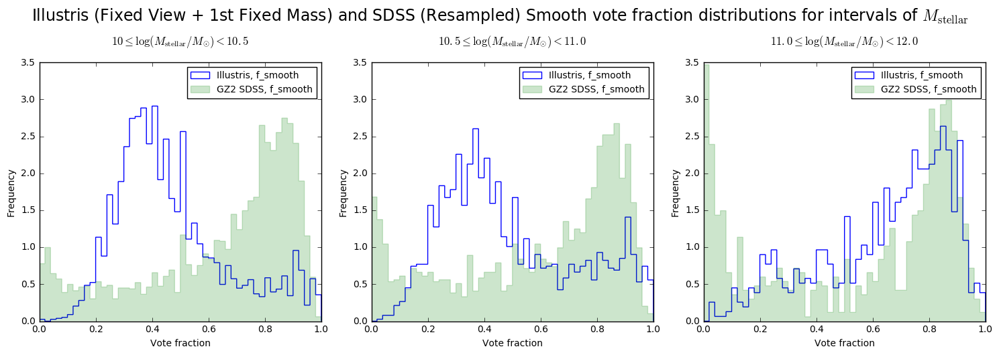

In [368]:
gc.collect()

logStellarMassIntervals = [ [10, 10.5], [10.5, 11.0], [11.0, 12.0] ] # Units are log_10(solar mass)

intervalVoteFracFigure = plt.figure(figsize=(5*len(logStellarMassIntervals), 5))

for index, logStellarMassInterval in enumerate(logStellarMassIntervals) :
    sdssDataSelection = ((sdssDataSets[sdssDataSet][massInPercentageRadiusColumn] > logStellarMassInterval[0]) 
                         & (sdssDataSets[sdssDataSet][massInPercentageRadiusColumn] < logStellarMassInterval[1]))
    sdssSelectedData = sdssDataSets[sdssDataSet][sdssDataSelection]
    
    illustrisDataSelection = ((fullMdhAndIwdaCombinedDataViews[illustrisSampleSubset]['mass_stars_solar_units'] > logStellarMassInterval[0])
                              & (fullMdhAndIwdaCombinedDataViews[illustrisSampleSubset]['mass_stars_solar_units'] < logStellarMassInterval[1]))
    illustrisSelectedData = fullMdhAndIwdaCombinedDataViews[illustrisSampleSubset][illustrisDataSelection]
    
    axes = intervalVoteFracFigure.add_subplot(1,3,index+1)
    
    illustrisSelectedData['p_smooth'].plot.hist(ax=axes, bins=50, histtype='step', fill=False, alpha=1, normed=True, range=(0,1))
    sdssSelectedData['t01_smooth_or_features_a01_smooth_fraction'].plot.hist(ax=axes, bins=50, histtype='step', logy=False, fill=True, alpha=0.2, normed=True, range=(0,1))
    
    axes.set_ylim(0, 3.5)
    axes.set_title(r'${}\leq \log(M_{}/M_{}) < {}$'.format(logStellarMassInterval[0], r'{\rm stellar}', r'{\odot}', logStellarMassInterval[1]), size='large', y=1.05)
    axes.set_xlabel('Vote fraction')
    lines, labels = axes.get_legend_handles_labels()
    labels = [r'Illustris, f_smooth', 'GZ2 SDSS, f_smooth']
    axes.legend(lines[:2], labels[:2], loc='best', fontsize='medium')
    
plt.suptitle('Illustris (Fixed View + 1st Fixed Mass) and SDSS ({}) Smooth vote fraction distributions for intervals of $M_{}$'.format(sdssDataSet[0].upper() + sdssDataSet[1:],r'{\rm stellar}'), y=1.05, size=17)
plt.tight_layout()

## Plot the distributions of vote fraction for the raw SDSS dataset i.e. without resampling

### Raw: Comparitive plot of the *smooth* vote fraction for all stellar masses

In [369]:
sdssDataSet = 'raw'

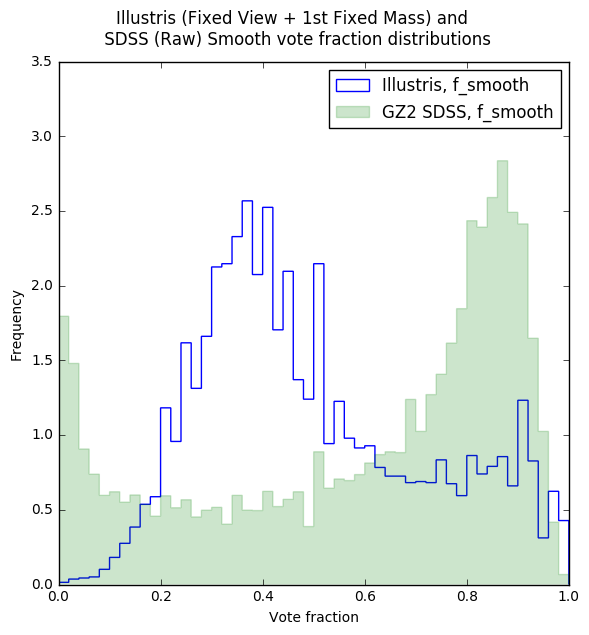

In [370]:
gc.collect()

smoothVoteFracRawFigure = plt.figure(figsize=(6,6))

sdssFullCut = ((gzSampleRedshiftCut(cjdlSdssDataFrame)) & (sdssDataSets[sdssDataSet][massInPercentageRadiusColumn] > 10))
sdssSelectedData = sdssDataSets[sdssDataSet][sdssFullCut]
illustrisSelectedData = fullMdhAndIwdaCombinedDataViews[illustrisSampleSubset]

axes = smoothVoteFracRawFigure.gca()

illustrisSelectedData['p_smooth'].plot.hist(ax=axes, bins=50, histtype='step', fill=False, alpha=1, normed=True, range=(0,1))
sdssSelectedData['t01_smooth_or_features_a01_smooth_fraction'].plot.hist(ax=axes, bins=50, histtype='step', logy=False, fill=True, alpha=0.2, normed=True, range=(0,1))

axes.set_xlabel('Vote fraction')
axes.set_ylim(0, 3.5)
lines, labels = axes.get_legend_handles_labels()
labels = [r'Illustris, f_smooth', 'GZ2 SDSS, f_smooth']
axes.legend(lines[:2], labels[:2], loc='best')
    
plt.suptitle('Illustris (Fixed View + 1st Fixed Mass) and \n SDSS ({}) Smooth vote fraction distributions'.format(sdssDataSet[0].upper() + sdssDataSet[1:]), y=1.05, size='large')
plt.tight_layout()

### Raw: Comparitive plots of the *smooth* vote fraction for stellar mass subsets bounded from *below*

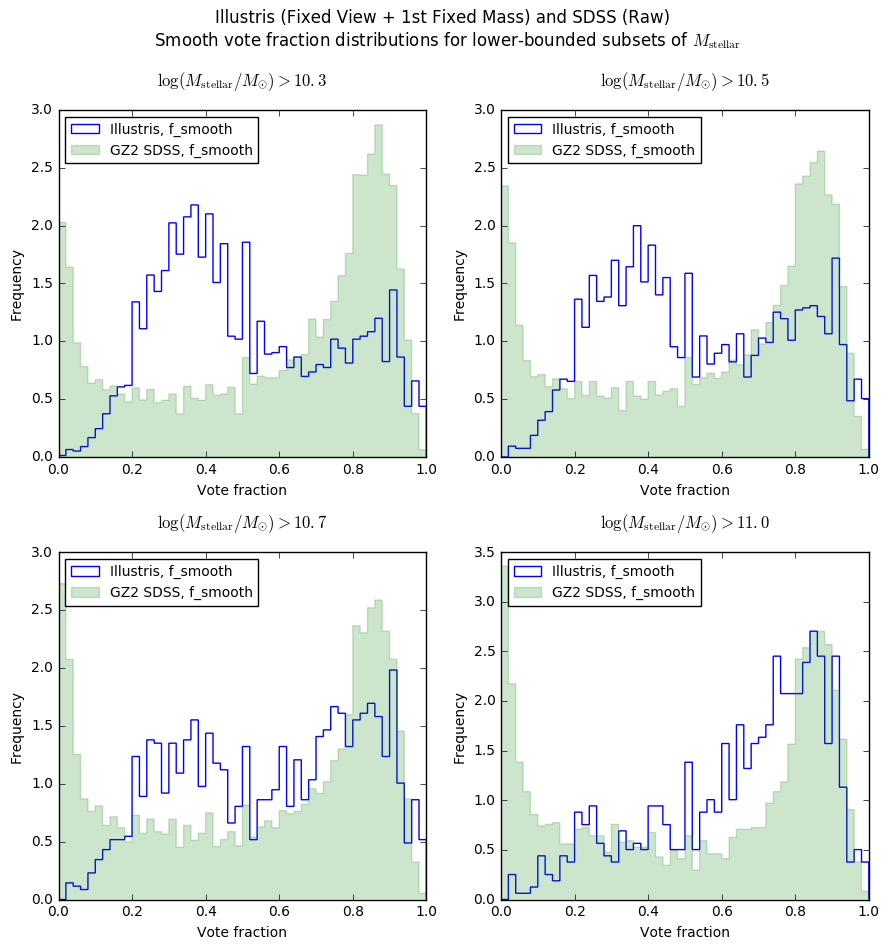

In [371]:
gc.collect()

lowerBoundVoteFracRawFigure = plt.figure(figsize=(9,9))

#ensure consistency by reusing logStellarMassLowerBounds from cell above
for index, logStellarMassLowerBound in enumerate(logStellarMassLowerBounds) :
    
    sdssDataSelection = ((gzSampleRedshiftCut(sdssDataSets[sdssDataSet])) 
                         & (sdssDataSets[sdssDataSet][massInPercentageRadiusColumn] > 10) 
                         & (sdssDataSets[sdssDataSet][massInPercentageRadiusColumn] > logStellarMassLowerBound))
    sdssSelectedData = sdssDataSets[sdssDataSet][sdssDataSelection]
    
    illustrisDataSelection = (fullMdhAndIwdaCombinedDataViews[illustrisSampleSubset]['mass_stars_solar_units'] > logStellarMassLowerBound)
    illustrisSelectedData = fullMdhAndIwdaCombinedDataViews[illustrisSampleSubset][illustrisDataSelection]
    
    axes = lowerBoundVoteFracRawFigure.add_subplot(2,2,index+1)
    
    illustrisSelectedData['p_smooth'].plot.hist(ax=axes, bins=50, histtype='step', fill=False, alpha=1, normed=True, range=(0,1))
    sdssSelectedData['t01_smooth_or_features_a01_smooth_fraction'].plot.hist(ax=axes, bins=50, histtype='step', logy=False, fill=True, alpha=0.2, normed=True, range=(0,1))
    
    axes.set_title(r'$\log(M_{}/M_{}) >{}$'.format(r'{\rm stellar}', r'{\odot}', logStellarMassLowerBound), size='large', y=1.05)
    axes.set_xlabel('Vote fraction')
    lines, labels = axes.get_legend_handles_labels()
    labels = [r'Illustris, f_smooth', 'GZ2 SDSS, f_smooth']
    axes.legend(lines[:2], labels[:2], loc='upper left', fontsize='medium')
    
plt.suptitle('Illustris (Fixed View + 1st Fixed Mass) and SDSS ({}) \n Smooth vote fraction distributions for lower-bounded subsets of $M_{}$'.format(sdssDataSet[0].upper() + sdssDataSet[1:],r'{\rm stellar}'), y=1.05, size='large')
plt.tight_layout()

### Raw: Comparitive plots of the *smooth* vote fraction for stellar mass intervals

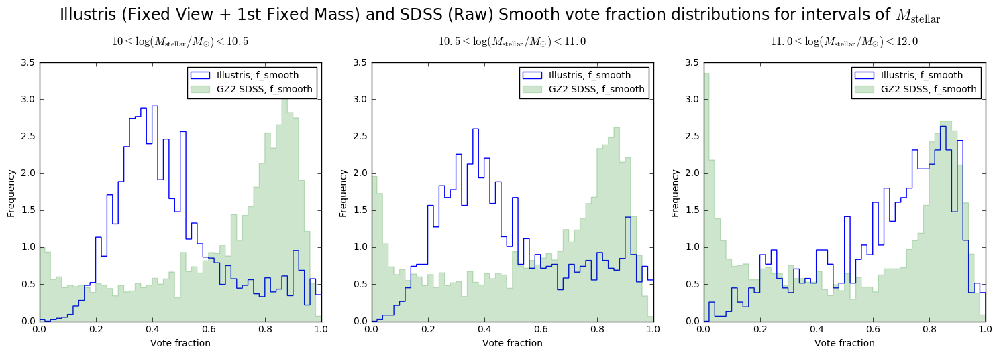

In [372]:
gc.collect()

logStellarMassIntervals = [ [10, 10.5], [10.5, 11.0], [11.0, 12.0] ] # Units are log_10(solar mass)

intervalVoteFracFigure = plt.figure(figsize=(5*len(logStellarMassIntervals), 5))

for index, logStellarMassInterval in enumerate(logStellarMassIntervals) :
    sdssDataSelection = ((gzSampleRedshiftCut(sdssDataSets[sdssDataSet])) 
                         & (sdssDataSets[sdssDataSet][massInPercentageRadiusColumn] > 10)
                         & (sdssDataSets[sdssDataSet][massInPercentageRadiusColumn] > logStellarMassInterval[0]) 
                         & (sdssDataSets[sdssDataSet][massInPercentageRadiusColumn] < logStellarMassInterval[1]))
    sdssSelectedData = sdssDataSets[sdssDataSet][sdssDataSelection]
    
    illustrisDataSelection = ((fullMdhAndIwdaCombinedDataViews[illustrisSampleSubset]['mass_stars_solar_units'] > logStellarMassInterval[0])
                              & (fullMdhAndIwdaCombinedDataViews[illustrisSampleSubset]['mass_stars_solar_units'] < logStellarMassInterval[1]))
    illustrisSelectedData = fullMdhAndIwdaCombinedDataViews[illustrisSampleSubset][illustrisDataSelection]
    
    axes = intervalVoteFracFigure.add_subplot(1,len(logStellarMassIntervals),index+1)
    
    illustrisSelectedData['p_smooth'].plot.hist(ax=axes, bins=50, histtype='step', fill=False, alpha=1, normed=True, range=(0,1))
    sdssSelectedData['t01_smooth_or_features_a01_smooth_fraction'].plot.hist(ax=axes, bins=50, histtype='step', logy=False, fill=True, alpha=0.2, normed=True, range=(0,1))
    
    axes.set_ylim(0, 3.5)
    axes.set_title(r'${}\leq \log(M_{}/M_{}) < {}$'.format(logStellarMassInterval[0], r'{\rm stellar}', r'{\odot}', logStellarMassInterval[1]), size='large', y=1.05)
    axes.set_xlabel('Vote fraction')
    lines, labels = axes.get_legend_handles_labels()
    labels = [r'Illustris, f_smooth', 'GZ2 SDSS, f_smooth']
    axes.legend(lines[:2], labels[:2], loc='best', fontsize='medium')
    
plt.suptitle('Illustris (Fixed View + 1st Fixed Mass) and SDSS ({}) Smooth vote fraction distributions for intervals of $M_{}$'.format(sdssDataSet[0].upper() + sdssDataSet[1:], r'{\rm stellar}'), y=1.05, size=17)
plt.tight_layout()

## Compare Illustris and SDSS vote fraction distributions for separate SDSS A/B subsets
To investigate how the absence of dust simulation in the *Illustris* dataset affects the vote fraction distributions, the subsample of SDSS galaxies for which an exponential profile fit (indicated by `fracDeV_*` < 0.5, and likely indicating a disk dominated galaxy) is preferred, is further subdivided into bins of major-to-minor axis length ratio and the corresponding vote fraction distribution compared with the Illustris vote fraction distribution.

In [373]:
# Cut to select SDSS galaxies for which an exponential profile fit (indicating a likely disk galaxy) was preferred
gzSampleExpProfileCut = lambda dataset : (dataset['fracDeV_r'] < 0.5)

sdssBands = 'ugriz'
gzSampleExpProfileBandColumns = ['expAB_' +  band for band in sdssBands]
# Modify to select a different SDSS band
gzSampleExpProfileBandColumn = gzSampleExpProfileBandColumns[2]

### 2D distributions of the measured A/B ratio versus fraction human classifier that percieved an edge-on disk.

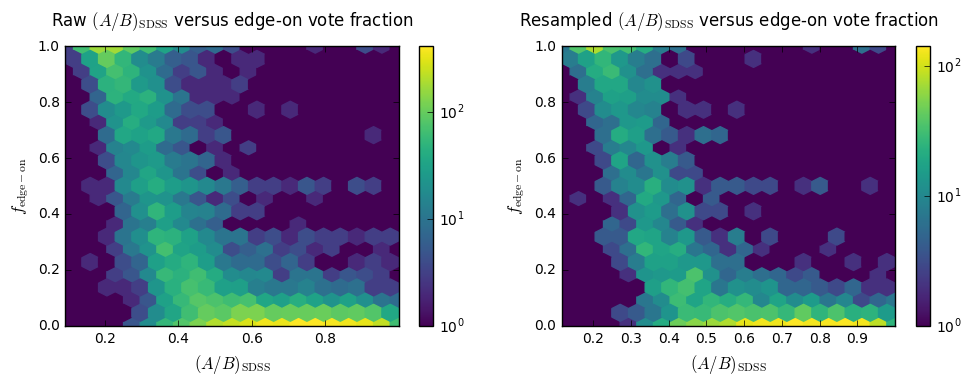

In [374]:
gc.collect()

sdssGzAbFigure = plt.figure(figsize=(10, 4))

sdssFrames = {'raw' : cjdlSdssDataFrame, 'resampled' : sdssToIllustrisResampledData}

for index, sdssFrameDatum in enumerate(sdssFrames.items()) :
    sdssFrameLabel, sdssFrame = sdssFrameDatum
    sdssGzAbAxes = sdssGzAbFigure.add_subplot(1,len(sdssFrames),index+1)
    sdssDataSelection = ((gzSampleRedshiftCut(sdssFrame)) 
                         & (gzSampleExpProfileCut(sdssFrame)))
    sdssSelectedData = sdssFrame[sdssDataSelection]

    sdssGzAbAxes = sdssSelectedData.dropna(subset=['t02_edgeon_a04_yes_fraction', gzSampleExpProfileBandColumn]).plot.hexbin(ax=sdssGzAbAxes, x=gzSampleExpProfileBandColumn, y='t02_edgeon_a04_yes_fraction', cmap='viridis', gridsize=20, sharex=False, norm=matplotlib.colors.LogNorm())
    sdssGzAbAxes.set_ylabel(r'$f_{\rm edge-on}$', size='large')
    sdssGzAbAxes.set_xlabel(r'$(A/B)_{\rm SDSS}$', size='large')
    sdssGzAbAxes.set_title(r'{} $(A/B)_{}$ versus edge-on vote fraction'.format(sdssFrameLabel[0].upper() + sdssFrameLabel[1:], r'{\rm SDSS}'), size='large', y=1.05)
plt.tight_layout()

### Resampled: Comparitive plots of the *smooth* vote fraction for SDSS *measured* $A/B$ ratio intervals

In [375]:
sdssDataSet = 'resampled'

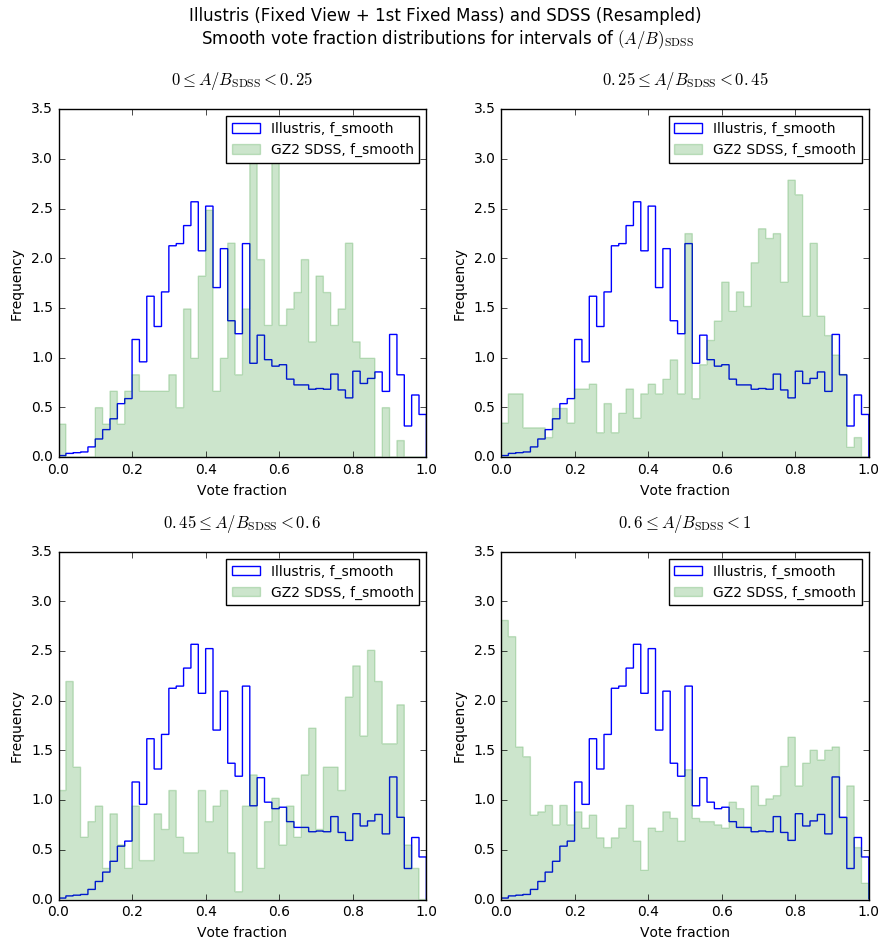

In [376]:
gc.collect()

sdssAbIntervals = [[0, 0.25], [0.25, 0.45], [0.45, 0.6], [0.6, 1]]

sdssAbIntervalVoteFracFigure = plt.figure(figsize=(9,9))

for index, sdssAbInterval in enumerate(sdssAbIntervals) :
    sdssDataSelection = ((gzSampleRedshiftCut(sdssDataSets[sdssDataSet])) 
                         & (gzSampleExpProfileCut(sdssDataSets[sdssDataSet]))
                         & (sdssDataSets[sdssDataSet][gzSampleExpProfileBandColumn] > sdssAbInterval[0]) 
                         & (sdssDataSets[sdssDataSet][gzSampleExpProfileBandColumn] < sdssAbInterval[1]))
    sdssSelectedData = sdssDataSets[sdssDataSet][sdssDataSelection]
    
    # This code selects all illustris data. It is therefore a no-op that is retained in case cuts are desired later
    illustrisDataSelection = np.ones_like(fullMdhAndIwdaCombinedDataViews[illustrisSampleSubset].index, dtype=bool)
    illustrisSelectedData = fullMdhAndIwdaCombinedDataViews[illustrisSampleSubset][illustrisDataSelection]
    
    axes = sdssAbIntervalVoteFracFigure.add_subplot(2,2,index+1)
    
    illustrisSelectedData['p_smooth'].plot.hist(ax=axes, bins=50, histtype='step', fill=False, alpha=1, normed=True, range=(0,1))
    sdssSelectedData['t01_smooth_or_features_a01_smooth_fraction'].plot.hist(ax=axes, bins=50, histtype='step', logy=False, fill=True, alpha=0.2, normed=True, range=(0,1))
    
    axes.set_ylim(0, 3.5)
    axes.set_title(r'${}\leq A/B_{} < {}$'.format(sdssAbInterval[0], r'{\rm SDSS}', sdssAbInterval[1]), size='large', y=1.05)
    axes.set_xlabel('Vote fraction')
    lines, labels = axes.get_legend_handles_labels()
    labels = [r'Illustris, f_smooth', 'GZ2 SDSS, f_smooth']
    axes.legend(lines[:2], labels[:2], loc='best', fontsize='medium')
    
plt.suptitle('Illustris (Fixed View + 1st Fixed Mass) and SDSS ({})\n Smooth vote fraction distributions for intervals of $(A/B)_{}$'.format(sdssDataSet[0].upper() + sdssDataSet[1:], r'{\rm SDSS}'), y=1.05, size='large')
plt.tight_layout()

### Raw: Comparitive plots of the *smooth* vote fraction for SDSS *measured* $A/B$ ratio intervals

In [377]:
sdssDataSet = 'raw'

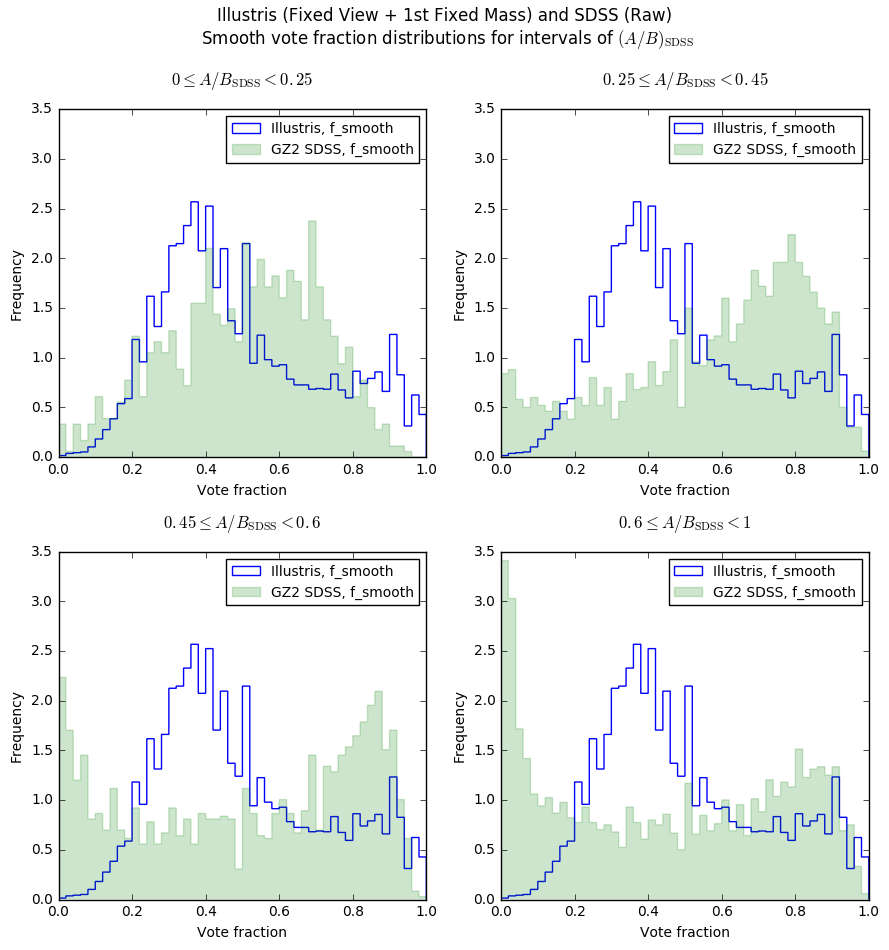

In [378]:
gc.collect()

sdssAbIntervals = [[0, 0.25], [0.25, 0.45], [0.45, 0.6], [0.6, 1]]

sdssAbIntervalVoteFracFigure = plt.figure(figsize=(9,9))

for index, sdssAbInterval in enumerate(sdssAbIntervals) :
    sdssDataSelection = ((gzSampleRedshiftCut(sdssDataSets[sdssDataSet])) 
                         & (gzSampleExpProfileCut(sdssDataSets[sdssDataSet]))
                         & (sdssDataSets[sdssDataSet][gzSampleExpProfileBandColumn] > sdssAbInterval[0]) 
                         & (sdssDataSets[sdssDataSet][gzSampleExpProfileBandColumn] < sdssAbInterval[1]))
    sdssSelectedData = sdssDataSets[sdssDataSet][sdssDataSelection]
    
    # This code selects all illustris data. It is therefore a no-op that is retained in case cuts are desired later
    illustrisDataSelection = np.ones_like(fullMdhAndIwdaCombinedDataViews[illustrisSampleSubset].index, dtype=bool)
    illustrisSelectedData = fullMdhAndIwdaCombinedDataViews[illustrisSampleSubset][illustrisDataSelection]
    
    axes = sdssAbIntervalVoteFracFigure.add_subplot(2,2,index+1)
    
    illustrisSelectedData['p_smooth'].plot.hist(ax=axes, bins=50, histtype='step', fill=False, alpha=1, normed=True, range=(0,1))
    sdssSelectedData['t01_smooth_or_features_a01_smooth_fraction'].plot.hist(ax=axes, bins=50, histtype='step', logy=False, fill=True, alpha=0.2, normed=True, range=(0,1))
    
    axes.set_ylim(0, 3.5)
    axes.set_title(r'${}\leq A/B_{} < {}$'.format(sdssAbInterval[0], r'{\rm SDSS}', sdssAbInterval[1]), size='large', y=1.05)
    axes.set_xlabel('Vote fraction')
    lines, labels = axes.get_legend_handles_labels()
    labels = [r'Illustris, f_smooth', 'GZ2 SDSS, f_smooth']
    axes.legend(lines[:2], labels[:2], loc='best', fontsize='medium')
    
plt.suptitle('Illustris (Fixed View + 1st Fixed Mass) and SDSS ({})\n Smooth vote fraction distributions for intervals of $(A/B)_{}$'.format(sdssDataSet[0].upper() + sdssDataSet[1:], r'{\rm SDSS}'), y=1.05, size='large')
plt.tight_layout()

## Compare distributions of absolute magnitude for SDSS and Illustris samples
There are two columns provided by the illustris collaboration that may refer to absolute magnitude: `absmag_*` and `stellarphotometrics_*` where `*` $\in$ [u,g,r,i,z] represents the SDSS apectral band. 

### Data redundancy: Compare band-specific values of `absmag_*` and `stellarphotometrics_*` : `*` $\in$ [u,g,r,i,z]
In fact, it seems appears counterpart columns contain identical data. Unfortunately (see below), neither match the SDSS distributions! **Subsequent plots use the `absmag_*` columns for Illustris data.**

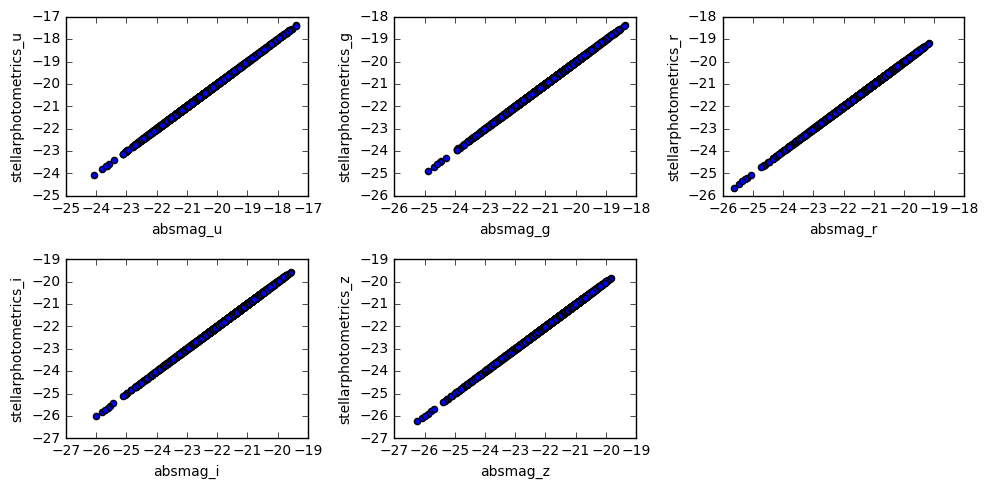

In [379]:
illustrisMagnitudeColumnCompFigure = plt.figure(figsize=(10,5))
for index, sdssBand in enumerate(sdssBands) :
    illustrisMagnitudeColumnCompAxes = illustrisMagnitudeColumnCompFigure.add_subplot(2,3,index+1)
    illustrisMagnitudeColumnCompAxes = fullMdhAndIwdaCombinedDataViews[illustrisSampleSubset].plot.scatter(ax=illustrisMagnitudeColumnCompAxes, x='absmag_'+sdssBand, y='stellarphotometrics_'+sdssBand, sharex=False)

plt.tight_layout()

###  SDSS absolute magnitude columns
The [SDSS CasJobs database](http://skyserver.sdss.org/dr13/en/help/browser/browser.aspx#&&history=description+SpecPhoto+V) provides many variants of [observed magnitudes](http://www.sdss.org/dr12/algorithms/magnitudes/). The subsequently plotted data are derived from the `petroMag_*` columns (where as above `*` $\in$ [u,g,r,i,z] represents the SDSS spectral band) and converted to absolute magnitude using the CasJobs database function [fCosmoAbsMag()](http://skyserver.sdss.org/dr13/en/help/browser/browser.aspx#&&history=description+fCosmoAbsMag+F). The conversion is currently done using the default cosmological values, which are derived from WMAP-5 data. 

**These are slightly different from those used by [Illustris](http://www.illustris-project.org/data/downloads/Illustris-1/) in their simulation, which are derived from WMAP-9**.

Begin by defining the *apparent* Petrosian magnitude limits for the SDSS (DR8) survey in each band $\in$ [u,g,r,i,z] ([Data source](https://www.sdss3.org/dr8/scope.php)). Also define a data selection function that removes targets fainter than the magnitude limit for a specified band.

In [380]:
sdssApparentMagLimits = {'u':22,
                         'g':22.2,
                         'r':17.77,
                         'i':21.3,
                         'z':20.5}

gzSampleAbsMagCut = lambda dataset, band : ((dataset['absPetroMag_' + band] > -9000) & (dataset['petroMag_' + band] < sdssApparentMagLimits[band]))

### Resampled: Comparitive plots of the absolute magnitude distributions for Illustris and SDSS galaxies

In [381]:
sdssDataSet = 'resampled'

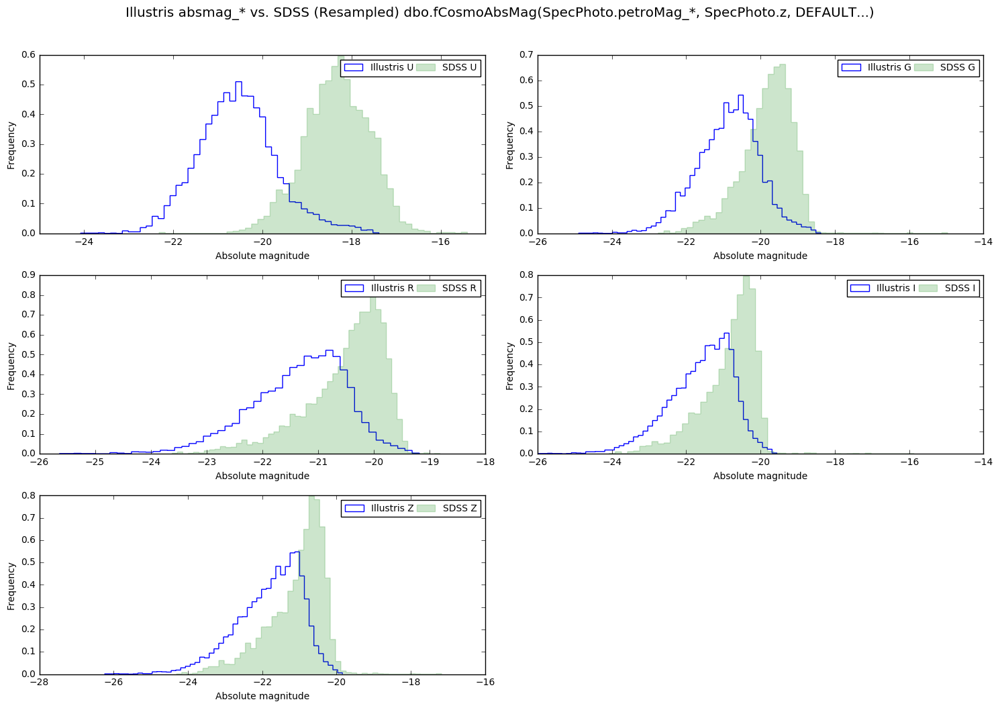

In [383]:
gc.collect()

magCompSloanIlustrisFigure = plt.figure(figsize=(15, 10))

for index, sdssBand in enumerate(sdssBands) :
    magCompSloanIlustrisAxes = magCompSloanIlustrisFigure.add_subplot(3, 2, index+1)
    
    sdssDataSelection = ((gzSampleRedshiftCut(sdssDataSets[sdssDataSet])) 
                         & (gzSampleAbsMagCut(sdssDataSets[sdssDataSet], sdssBand)))
    sdssSelectedData = sdssDataSets[sdssDataSet][sdssDataSelection]
    
    # This code selects all illustris data. It is therefore a no-op that is retained in case cuts are desired later
    illustrisDataSelection = np.ones_like(fullMdhAndIwdaCombinedDataViews[illustrisSampleSubset].index, dtype=bool)
    illustrisSelectedData = fullMdhAndIwdaCombinedDataViews[illustrisSampleSubset][illustrisDataSelection]
 
    illustrisSelectedData['absmag_' + sdssBand].plot.hist(ax=magCompSloanIlustrisAxes, bins=50, histtype='step', fill=False, alpha=1, normed=True)
    sdssSelectedData['absPetroMag_' + sdssBand].plot.hist(ax=magCompSloanIlustrisAxes, bins=50, histtype='step', logy=False, fill=True, alpha=0.2, normed=True)
    
    lines, labels = magCompSloanIlustrisAxes.get_legend_handles_labels()
    labels = ['Illustris ' + str(sdssBand.upper()), 'SDSS ' + str(sdssBand.upper())]
    magCompSloanIlustrisAxes.legend(lines[:2], labels[:2], loc='best', ncol=3, columnspacing=0.3, fontsize='medium')
    plt.xlabel("Absolute magnitude")

magCompSloanIlustrisFigure.suptitle('Illustris absmag_* vs. SDSS ({}) dbo.fCosmoAbsMag(SpecPhoto.petroMag_*, SpecPhoto.z, DEFAULT...)'.format(sdssDataSet[0].upper() + sdssDataSet[1:]), size='x-large', y=1.05)    
plt.tight_layout()

### Raw: Comparitive plots of the absolute magnitude distributions for Illustris and SDSS galaxies

In [385]:
sdssDataSet = 'raw'

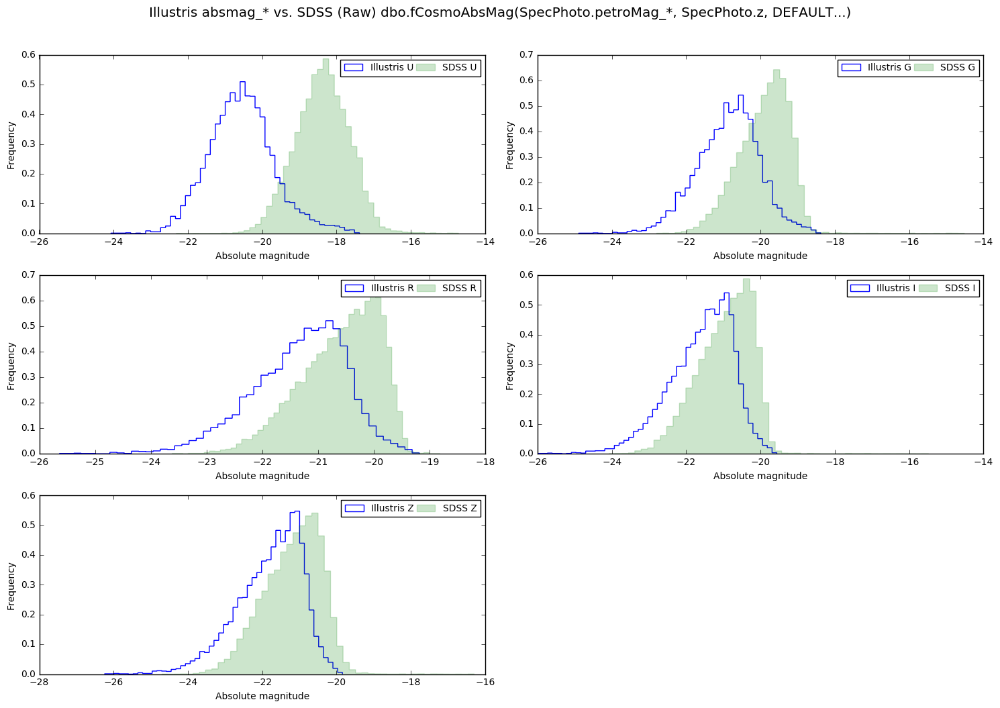

In [386]:
gc.collect()

magCompSloanIlustrisFigure = plt.figure(figsize=(15, 10))

for index, sdssBand in enumerate(sdssBands) :
    magCompSloanIlustrisAxes = magCompSloanIlustrisFigure.add_subplot(3, 2, index+1)
    
    sdssDataSelection = ((gzSampleRedshiftCut(sdssDataSets[sdssDataSet])) 
                         & (gzSampleAbsMagCut(sdssDataSets[sdssDataSet], sdssBand)))
    sdssSelectedData = sdssDataSets[sdssDataSet][sdssDataSelection]
    
    # This code selects all illustris data. It is therefore a no-op that is retained in case cuts are desired later
    illustrisDataSelection = np.ones_like(fullMdhAndIwdaCombinedDataViews[illustrisSampleSubset].index, dtype=bool)
    illustrisSelectedData = fullMdhAndIwdaCombinedDataViews[illustrisSampleSubset][illustrisDataSelection]
 
    illustrisSelectedData['absmag_' + sdssBand].plot.hist(ax=magCompSloanIlustrisAxes, bins=50, histtype='step', fill=False, alpha=1, normed=True)
    sdssSelectedData['absPetroMag_' + sdssBand].plot.hist(ax=magCompSloanIlustrisAxes, bins=50, histtype='step', logy=False, fill=True, alpha=0.2, normed=True)
    
    lines, labels = magCompSloanIlustrisAxes.get_legend_handles_labels()
    labels = ['Illustris ' + str(sdssBand.upper()), 'SDSS ' + str(sdssBand.upper())]
    magCompSloanIlustrisAxes.legend(lines[:2], labels[:2], loc='best', ncol=3, columnspacing=0.3, fontsize='medium')
    plt.xlabel("Absolute magnitude")

magCompSloanIlustrisFigure.suptitle('Illustris absmag_* vs. SDSS ({}) dbo.fCosmoAbsMag(SpecPhoto.petroMag_*, SpecPhoto.z, DEFAULT...)'.format(sdssDataSet[0].upper() + sdssDataSet[1:]), size='x-large', y=1.05)    
plt.tight_layout()

## Bivariate distributions of absolute magnitude versus $\log(M_{\rm stellar}$)
**Initially** plot the absolute magnitude verus the logarithm of the stellar mass. Recall that for the **resampled datasets** the stellar mass distributions are matched, so the SDSS data are implicitly cut at $\log(M_{\rm stellar}) = 10$.

In [394]:
sdssDataSet = 'resampled'

### Resampled

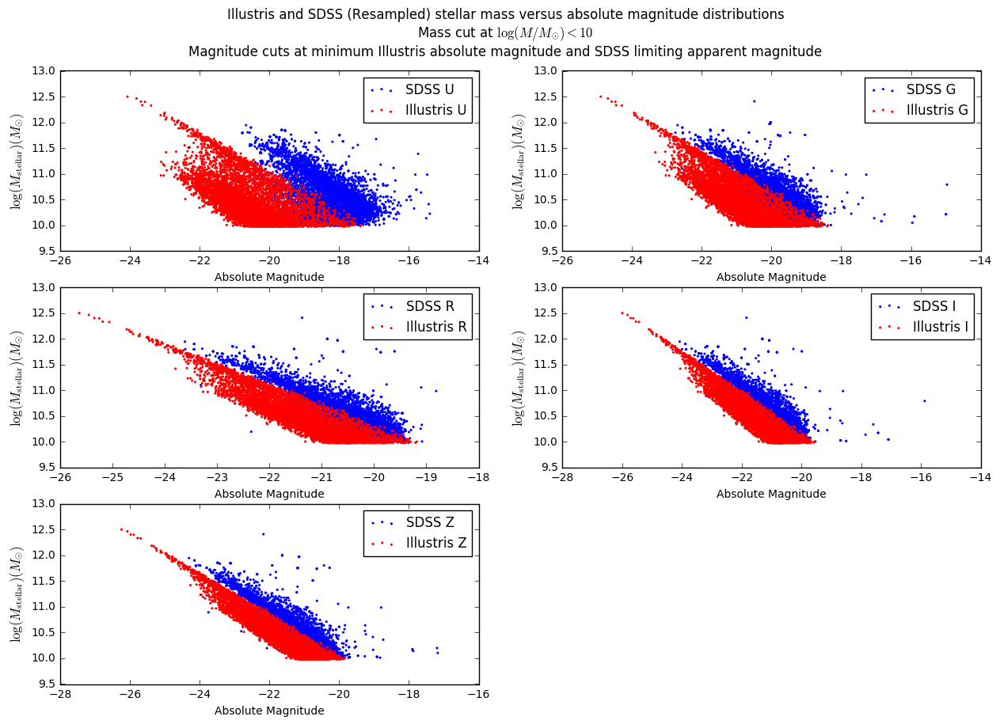

In [408]:
gc.collect()

absMagVMassCompSloanIlustrisFigure = plt.figure(figsize=(15, 10))

for index, sdssBand in enumerate(sdssBands) :
    absMagVMassCompSloanIlustrisAxes = absMagVMassCompSloanIlustrisFigure.add_subplot(3, 2, index+1)
    
    sdssDataSelection = ((gzSampleRedshiftCut(sdssDataSets[sdssDataSet])) 
                         & (gzSampleAbsMagCut(sdssDataSets[sdssDataSet], sdssBand)) 
                         & (sdssDataSets[sdssDataSet]['lgm_tot_p97p5'] > 10))
    sdssSelectedData = sdssDataSets[sdssDataSet][sdssDataSelection]

    # This code selects all illustris data. It is therefore a no-op that is retained in case cuts are desired later
    illustrisDataSelection = np.ones_like(fullMdhAndIwdaCombinedDataViews[illustrisSampleSubset].index, dtype=bool)
    illustrisSelectedData = fullMdhAndIwdaCombinedDataViews[illustrisSampleSubset][illustrisDataSelection]
    
    sdssSelectedData.plot.scatter(x='absPetroMag_' + sdssBand, y='lgm_tot_p97p5', label='SDSS ' + sdssBand.upper(), ax=absMagVMassCompSloanIlustrisAxes, alpha=1, marker='.', color='b', edgecolors='None', legend=True)
    illustrisSelectedData.plot.scatter(x='absmag_' + sdssBand, y='mass_stars_solar_units',ax=absMagVMassCompSloanIlustrisAxes, alpha=1, marker='.', edgecolors='None', color='r', label='Illustris ' + sdssBand.upper())

    plt.ylabel(r'$\log(M_{\rm stellar}) (M_{\odot})$', size='large')    
    plt.xlabel(r'Absolute Magnitude')

absMagVMassCompSloanIlustrisFigure.suptitle('Illustris and SDSS ({}) stellar mass versus absolute magnitude distributions\nMass cut at $\log(M/M_{}) < 10$\nMagnitude cuts at minimum Illustris absolute magnitude and SDSS limiting apparent magnitude'.format(sdssDataSet[0].upper() + sdssDataSet[1:], r'{\odot}'), size=12)


## Convert absolute magnitude to luminosity
Now use $L=L_{\odot}\cdot10^{(\frac{M_{\odot} - M_{\rm galaxy}}{2.5})}$ to convert from absolute magnitude to luminosity with $M_{\odot}=-4.77$ representing the absolute magnitude of the sun and $L_{\odot}=3.9\times10^{33}\;{\rm erg\;s^{-1}}$ the solar luminosity.

The **three** outlying SDDS data with absolute magnitudes less than the minimum absolute magnitude of any sample in the illustris dataset are cut to achieve axes that better reveal the differences in distribution between the bulk of the data.

As before, there is an implicit cut at $\log_{10}(M_{\rm stellar}) = 10$.

In [423]:
solarLuminosity = 3.9e33 # erg s^{-1}
solarAbsMag = 4.77

computeLuminosityFromAbsMag = lambda dataset, columnPrefix, band : solarLuminosity*(10**((solarAbsMag - (dataset[columnPrefix + band])/2.5)))

for index, sdssBand in enumerate(sdssBands) :
    for illustrisKey in fullMdhAndIwdaCombinedDataViews :
        fullMdhAndIwdaCombinedDataViews[illustrisKey]['lum_from_absmag_' + sdssBand] = computeLuminosityFromAbsMag(fullMdhAndIwdaCombinedDataViews[illustrisKey], 'absmag_', sdssBand)
    for sdssKey in sdssDataSets :
        sdssDataSets[sdssKey]['lum_from_absPetroMag_' + sdssBand] = computeLuminosityFromAbsMag(sdssDataSets[sdssKey], 'absPetroMag_', sdssBand)

/opt/local/Library/Frameworks/Python.framework/Versions/3.5/lib/python3.5/site-packages/ipykernel/__main__.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


### Resampled

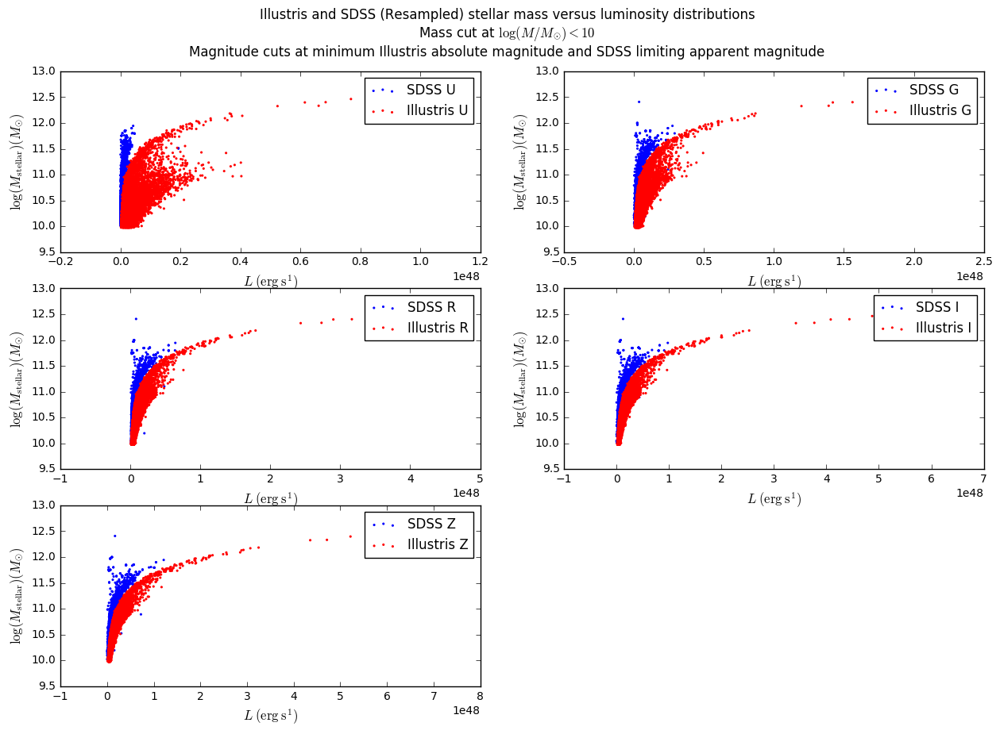

In [414]:
gc.collect()

luminosityVMassCompSloanIlustrisFigure = plt.figure(figsize=(15, 10))

for index, sdssBand in enumerate(sdssBands) :
    luminosityVMassCompSloanIlustrisAxes = luminosityVMassCompSloanIlustrisFigure.add_subplot(3, 2, index+1)
    
    sdssDataSelection = ((gzSampleRedshiftCut(sdssDataSets[sdssDataSet])) 
                         & (gzSampleAbsMagCut(sdssDataSets[sdssDataSet], sdssBand)) 
                         & (sdssDataSets[sdssDataSet]['lgm_tot_p97p5'] > 10))
    sdssSelectedData = sdssDataSets[sdssDataSet][sdssDataSelection]

    # This code selects all illustris data. It is therefore a no-op that is retained in case cuts are desired later
    illustrisDataSelection = np.ones_like(fullMdhAndIwdaCombinedDataViews[illustrisSampleSubset].index, dtype=bool)
    illustrisSelectedData = fullMdhAndIwdaCombinedDataViews[illustrisSampleSubset][illustrisDataSelection]
    
    sdssSelectedData.plot.scatter(x='lum_from_absPetroMag_' + sdssBand, y='lgm_tot_p97p5', label='SDSS ' + sdssBand.upper(), ax=luminosityVMassCompSloanIlustrisAxes, alpha=1, marker='.', color='b', edgecolors='None', legend=True)
    illustrisSelectedData.plot.scatter(x='lum_from_absmag_' + sdssBand, y='mass_stars_solar_units',ax=luminosityVMassCompSloanIlustrisAxes, alpha=1, marker='.', edgecolors='None', color='r', label='Illustris ' + sdssBand.upper())

    plt.ylabel(r'$\log(M_{\rm stellar}) (M_{\odot})$', size='large')    
    plt.xlabel(r'$L\;({\rm erg\;s^{1}})$', size='large')

luminosityVMassCompSloanIlustrisFigure.suptitle('Illustris and SDSS ({}) stellar mass versus luminosity distributions\nMass cut at $\log(M/M_{}) < 10$\nMagnitude cuts at minimum Illustris absolute magnitude and SDSS limiting apparent magnitude'.format(sdssDataSet[0].upper() + sdssDataSet[1:], r'{\odot}'), size=12)


## Distributions of the $L/M_{\rm stellar}$ ratio for the mass-matched Illustris and SDSS samples.
The SDSS data selection mirror the previous set of plots.

In [416]:
solarLuminosity = 3.9e33 # erg s^{-1}
solarAbsMag = 4.77

computeLuminosityStellarMassRatio = lambda dataset, firstColumnPrefix, secondColumnPrefix, band : (dataset[firstColumnPrefix + band]/(10**dataset[secondColumnPrefix]))

for index, sdssBand in enumerate(sdssBands) :
    for illustrisKey in fullMdhAndIwdaCombinedDataViews :
        fullMdhAndIwdaCombinedDataViews[illustrisKey]['lum_stellarmass_ratio_' + sdssBand] = computeLuminosityStellarMassRatio(fullMdhAndIwdaCombinedDataViews[illustrisKey], 'lum_from_absmag_', 'mass_stars_solar_units', sdssBand)
    for sdssKey in sdssDataSets :
        sdssDataSets[sdssKey]['lum_stellarmass_ratio_' + sdssBand] = computeLuminosityStellarMassRatio(sdssDataSets[sdssKey], 'lum_from_absPetroMag_', 'lgm_tot_p97p5', sdssBand)

/opt/local/Library/Frameworks/Python.framework/Versions/3.5/lib/python3.5/site-packages/ipykernel/__main__.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


### Resampled: 

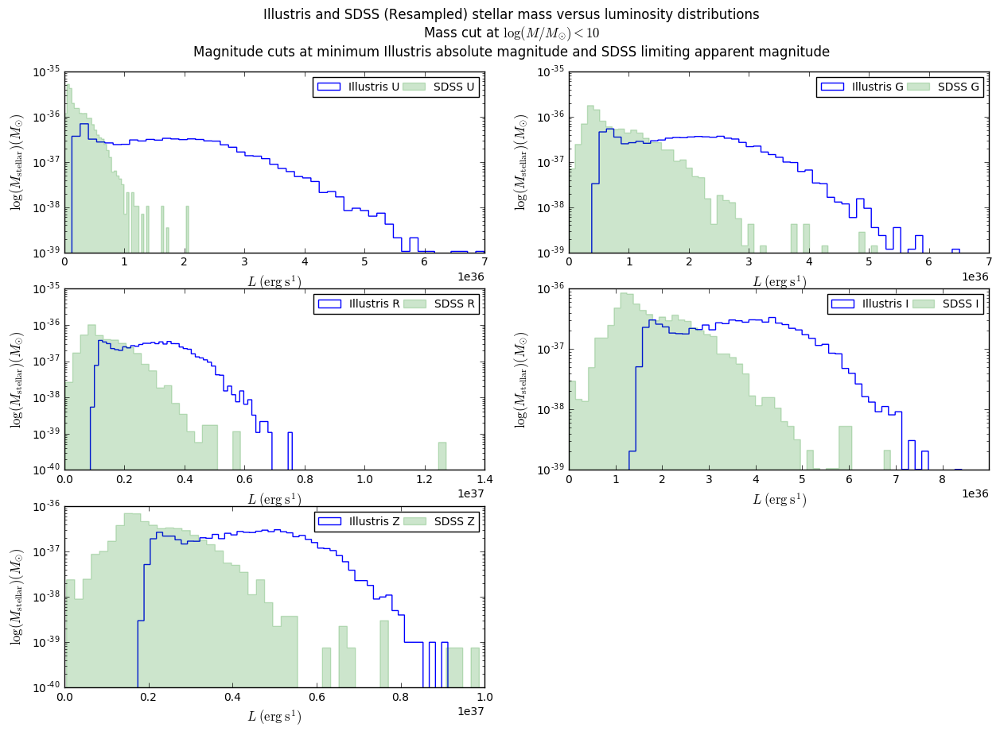

In [422]:
gc.collect()

luminosityStellarMassRatioCompSloanIlustrisFigure = plt.figure(figsize=(15, 10))

for index, sdssBand in enumerate(sdssBands) :
    luminosityStellarMassRatioCompSloanIlustrisAxes = luminosityStellarMassRatioCompSloanIlustrisFigure.add_subplot(3, 2, index+1)
    
    sdssDataSelection = ((gzSampleRedshiftCut(sdssDataSets[sdssDataSet])) 
                         & (gzSampleAbsMagCut(sdssDataSets[sdssDataSet], sdssBand)) 
                         & (sdssDataSets[sdssDataSet]['lgm_tot_p97p5'] > 10))
    sdssSelectedData = sdssDataSets[sdssDataSet][sdssDataSelection]

    # This code selects all illustris data. It is therefore a no-op that is retained in case cuts are desired later
    illustrisDataSelection = np.ones_like(fullMdhAndIwdaCombinedDataViews[illustrisSampleSubset].index, dtype=bool)
    illustrisSelectedData = fullMdhAndIwdaCombinedDataViews[illustrisSampleSubset][illustrisDataSelection]
    
    illustrisSelectedData['lum_stellarmass_ratio_' + sdssBand].plot.hist(ax=luminosityStellarMassRatioCompSloanIlustrisAxes, bins=50, histtype='step', fill=False, alpha=1, logy=True, normed=True)
    sdssSelectedData['lum_stellarmass_ratio_' + sdssBand].plot.hist(ax=luminosityStellarMassRatioCompSloanIlustrisAxes, bins=50, histtype='step', logy=True, fill=True, alpha=0.2, normed=True)
 
    luminosityStellarMassRatioCompSloanIlustrisAxes.set_ylabel(r'$\log(M_{\rm stellar}) (M_{\odot})$', size='large')    
    luminosityStellarMassRatioCompSloanIlustrisAxes.set_xlabel(r'$L\;({\rm erg\;s^{1}})$', size='large')
    
    lines, labels = luminosityStellarMassRatioCompSloanIlustrisAxes.get_legend_handles_labels()
    labels = ['Illustris ' + str(sdssBand.upper()), 'SDSS ' + str(sdssBand.upper())]
    luminosityStellarMassRatioCompSloanIlustrisAxes.legend(lines[:2], labels[:2], loc='best', ncol=3, columnspacing=0.3, fontsize='medium')

luminosityStellarMassRatioCompSloanIlustrisFigure.suptitle('Illustris and SDSS ({}) stellar mass versus luminosity distributions\nMass cut at $\log(M/M_{}) < 10$\nMagnitude cuts at minimum Illustris absolute magnitude and SDSS limiting apparent magnitude'.format(sdssDataSet[0].upper() + sdssDataSet[1:], r'{\odot}'), size=12)


## Generate distributions for subsets of data classified as *edge on* or *not edge on* 

### Begin by computing columns for the SDSS data that are equivalent to the Illustris `edge_on*` cases

In [425]:
computeSdssEdgeOnGZLabel = lambda dataset : (dataset['t02_edgeon_a04_yes_count'] > dataset['t02_edgeon_a05_no_count'])
computeSdssFeaturesEdgeOnGZLabel = lambda dataset : ((dataset['t01_smooth_or_features_a02_features_or_disk_fraction'] > 0.6) & dataset['is_edge_on'])  

for index, sdssBand in enumerate(sdssBands) :
    for sdssKey in sdssDataSets :
        sdssDataSets[sdssKey]['is_edge_on'] = computeSdssEdgeOnGZLabel(sdssDataSets[sdssKey])
        sdssDataSets[sdssKey]['is_features_and_edge_on'] = computeSdssFeaturesEdgeOnGZLabel(sdssDataSets[sdssKey])        

### Resampled: Plot the absolute magnitude distributions for *edge on* galaxies

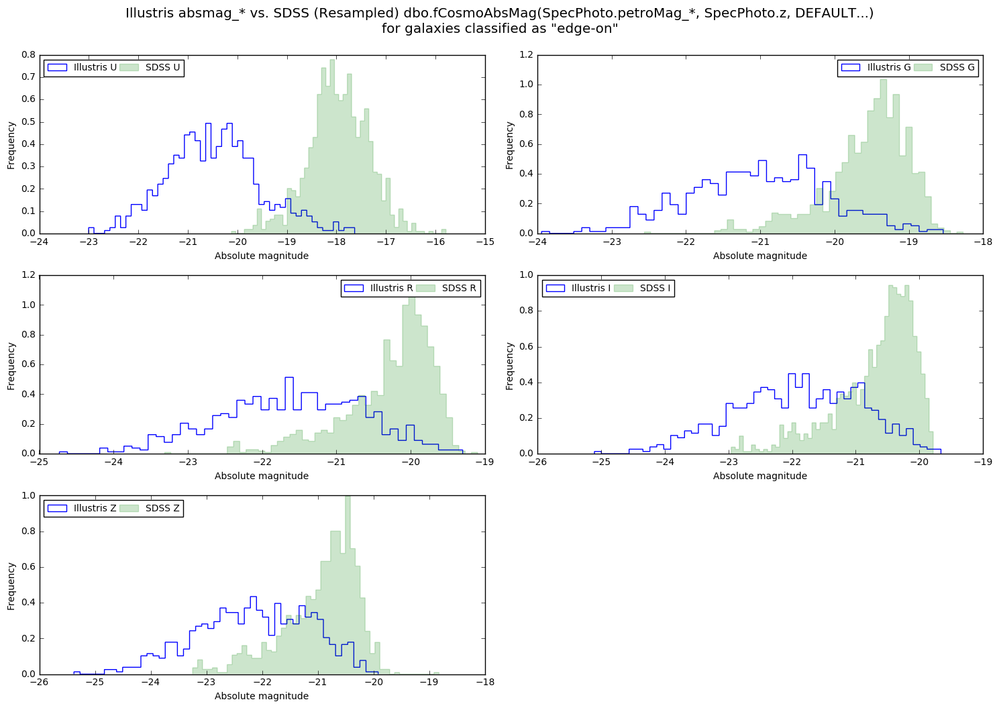

In [429]:
gc.collect()

magCompSloanIlustrisEdgeOnFigure = plt.figure(figsize=(15, 10))

for index, sdssBand in enumerate(sdssBands) :
    magCompSloanIlustrisEdgeOnAxes = magCompSloanIlustrisEdgeOnFigure.add_subplot(3, 2, index+1)
    
    sdssDataSelection = ((gzSampleRedshiftCut(sdssDataSets[sdssDataSet])) 
                         & (gzSampleAbsMagCut(sdssDataSets[sdssDataSet], sdssBand)) 
                         & sdssDataSets[sdssDataSet]['is_edge_on'])
    sdssSelectedData = sdssDataSets[sdssDataSet][sdssDataSelection]
    
    illustrisDataSelection = fullMdhAndIwdaCombinedDataViews[illustrisSampleSubset]['is_edge_on']
    illustrisSelectedData = fullMdhAndIwdaCombinedDataViews[illustrisSampleSubset][illustrisDataSelection]
 
    illustrisSelectedData['absmag_' + sdssBand].plot.hist(ax=magCompSloanIlustrisEdgeOnAxes, bins=50, histtype='step', fill=False, alpha=1, normed=True)
    sdssSelectedData['absPetroMag_' + sdssBand].plot.hist(ax=magCompSloanIlustrisEdgeOnAxes, bins=50, histtype='step', logy=False, fill=True, alpha=0.2, normed=True)
    
    lines, labels = magCompSloanIlustrisEdgeOnAxes.get_legend_handles_labels()
    labels = ['Illustris ' + str(sdssBand.upper()), 'SDSS ' + str(sdssBand.upper())]
    magCompSloanIlustrisEdgeOnAxes.legend(lines[:2], labels[:2], loc='best', ncol=3, columnspacing=0.3, fontsize='medium')
    plt.xlabel("Absolute magnitude")

magCompSloanIlustrisEdgeOnFigure.suptitle('Illustris absmag_* vs. SDSS ({}) dbo.fCosmoAbsMag(SpecPhoto.petroMag_*, SpecPhoto.z, DEFAULT...)\nfor galaxies classified as "edge-on"'.format(sdssDataSet[0].upper() + sdssDataSet[1:]), size='x-large', y=1.05)    
plt.tight_layout()

### Resampled: Plot the absolute magnitude distributions for *NOT edge on* galaxies

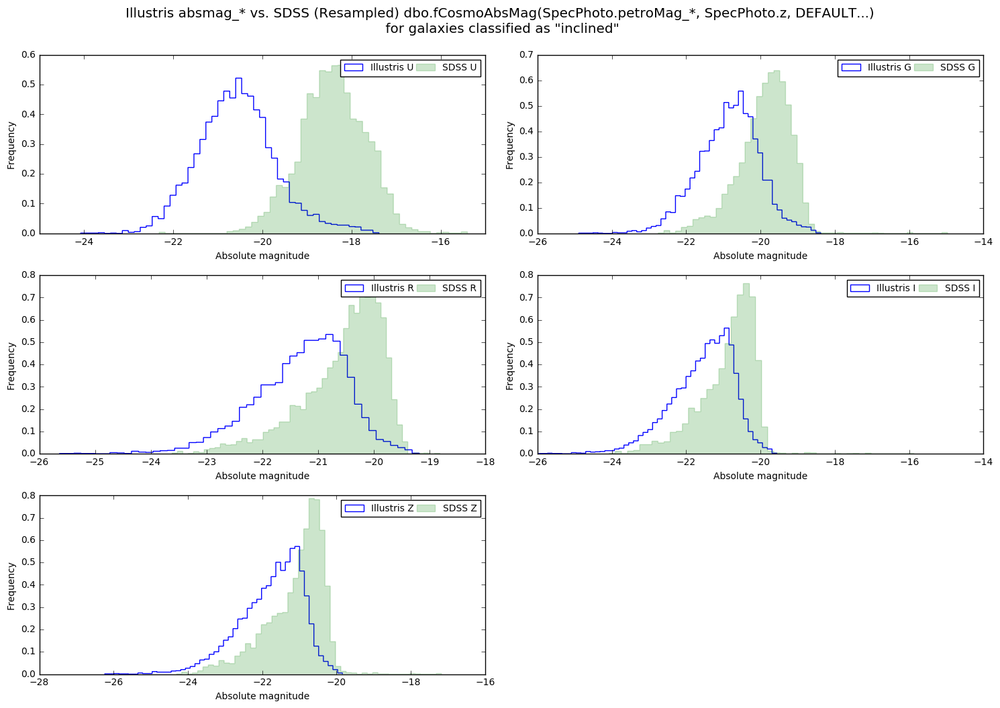

In [428]:
gc.collect()

magCompSloanIlustrisInclinedFigure = plt.figure(figsize=(15, 10))

for index, sdssBand in enumerate(sdssBands) :
    magCompSloanIlustrisInclinedAxes = magCompSloanIlustrisInclinedFigure.add_subplot(3, 2, index+1)
    
    sdssDataSelection = ((gzSampleRedshiftCut(sdssDataSets[sdssDataSet])) 
                         & (gzSampleAbsMagCut(sdssDataSets[sdssDataSet], sdssBand)) 
                         & ~(sdssDataSets[sdssDataSet]['is_edge_on']))
    sdssSelectedData = sdssDataSets[sdssDataSet][sdssDataSelection]
    
    illustrisDataSelection = ~(fullMdhAndIwdaCombinedDataViews[illustrisSampleSubset]['is_edge_on'])
    illustrisSelectedData = fullMdhAndIwdaCombinedDataViews[illustrisSampleSubset][illustrisDataSelection]
 
    illustrisSelectedData['absmag_' + sdssBand].plot.hist(ax=magCompSloanIlustrisInclinedAxes, bins=50, histtype='step', fill=False, alpha=1, normed=True)
    sdssSelectedData['absPetroMag_' + sdssBand].plot.hist(ax=magCompSloanIlustrisInclinedAxes, bins=50, histtype='step', logy=False, fill=True, alpha=0.2, normed=True)
    
    lines, labels = magCompSloanIlustrisInclinedAxes.get_legend_handles_labels()
    labels = ['Illustris ' + str(sdssBand.upper()), 'SDSS ' + str(sdssBand.upper())]
    magCompSloanIlustrisInclinedAxes.legend(lines[:2], labels[:2], loc='best', ncol=3, columnspacing=0.3, fontsize='medium')
    plt.xlabel("Absolute magnitude")

magCompSloanIlustrisInclinedFigure.suptitle('Illustris absmag_* vs. SDSS ({}) dbo.fCosmoAbsMag(SpecPhoto.petroMag_*, SpecPhoto.z, DEFAULT...)\n for galaxies classified as "inclined"'.format(sdssDataSet[0].upper() + sdssDataSet[1:]), size='x-large', y=1.05)    
plt.tight_layout()